In [10]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import mlflow

sns.set_theme(style='darkgrid')
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [11]:
raw_data = pd.read_csv('../data/processed/mhd_ch4_ml_v2.csv')
raw_data.tail(5)

/tmp/ipykernel_51558/150150391.py:1: DtypeWarning: Columns (37) have mixed types. Specify dtype option on import or set low_memory=False.
  raw_data = pd.read_csv('../data/processed/mhd_ch4_ml_v2.csv')


,date,time,type,sample,standard,port,ht,tmod,tamb,lab_temp,pflow,psamp,ploop,pamb,CH4_rt,CH4_w,CH4_ht,CH4_area,CH4_skew,CH4_start_time,CH4_end_time,CH4_start_level,CH4_end_level,CH4_Rl_ht,CH4_Rl_a,CH4_Rl,CH4_norm_ht,CH4_norm_a,CH4_norm_w,CH4_R_ht,CH4_R_a,CH4_R,CH4_C_ht,CH4_C_a,CH4_C,CH4_std_stdev,CH4_std_rep,CH4_Cstd,CH4_flag_ht,CH4_flag_a,CH4_flag,CH4_flag_p,CH4_flag_ht_bin,CH4_flag_a_bin,label1,datetime_str,datetime,is_ht_999,is_area_999,is_rt_zero,is_w_zero,duration,is_duration_spike,baseline_drift,ht_area_ratio,last_std_time,seconds_since_last_std,type_std,type_air,type_tank,type_blank,type_cal,type_other,last_cal_time,seconds_since_last_cal,year,month,day,hour,minute,seconds,psamp_roll_mean_10,pamb_roll_mean_10,pflow_roll_mean_10,tmod_roll_mean_10,psamp_roll_mean_100,pamb_roll_mean_100,pflow_roll_mean_100,tmod_roll_mean_100,psamp_roll_std_10,pamb_roll_std_10,pflow_roll_std_10,CH4_rt_roll_std_10,psamp_roll_std_100,pamb_roll_std_100,pflow_roll_std_100,CH4_rt_roll_std_100,psamp_diff_1,pflow_diff_1,CH4_area_diff_1,psamp_lag_1,pflow_lag_1
817950,260518,65300,std,J-286,J-286,3,0.0,40.0,22.06,NaN,813.5,752.32,NaN,752.4,77.8,3.98,133194.0,131007.0,0.50,73.0,99.8,99999.0,62297.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.649,NaN,2015.923,,,A,,0,0,0,260518065300,2026-05-18 06:53:00,False,False,False,False,26.8,False,-37702.0,1.016694,2026-05-18 06:13:00,2400.0,1,0,0,0,0,0,2026-04-28 06:18:00,1730100.0,2026,5,18,6,53,0,752.322,752.33,811.07,40.0,752.7259,752.700,811.938,40.0,0.100532,0.176698,2.445881,58.760792,0.525492,0.535601,2.558360,20.930976,0.01,-4.8,182060.0,752.26,808.6
817951,260518,71300,air,9m,J-286,1,9.0,40.0,22.32,NaN,808.6,752.28,NaN,752.2,79.0,4.57,160607.0,508996.0,0.46,73.0,102.0,99999.0,64464.0,1.02271,1.00491,1.00491,1.0227,1.0049,0.9981,1.02271,1.00491,1.00491,2061.71,2025.82,2025.82,3.649,3.666,2015.923,,,A,,0,0,0,260518071300,2026-05-18 07:13:00,False,False,False,False,29.0,False,-35535.0,0.315537,2026-05-18 06:13:00,3600.0,0,1,0,0,0,0,2026-04-28 06:18:00,1731300.0,2026,5,18,7,13,0,752.309,752.31,811.05,40.0,752.7119,752.686,811.921,40.0,0.089994,0.152388,2.422694,55.450498,0.517325,0.524745,2.542062,20.994550,0.06,4.9,-51053.0,752.32,813.5
817952,260518,73300,std,J-286,J-286,3,0.0,40.0,22.19,NaN,813.1,752.27,NaN,752.4,80.6,5.17,180892.0,882007.0,0.47,73.0,109.2,84204.0,66307.0,1.07106,1.34773,1.34773,1.0712,1.3480,1.0953,1.07106,1.34773,1.34773,2159.17,2716.92,2716.92,4.605,NaN,2015.923,,,A,,0,0,0,260518073300,2026-05-18 07:33:00,False,False,False,False,36.2,False,-17897.0,0.205091,2026-05-18 06:53:00,2400.0,1,0,0,0,0,0,2026-04-28 06:18:00,1732500.0,2026,5,18,7,33,0,752.294,752.28,811.00,40.0,752.6971,752.673,811.902,40.0,0.079470,0.139841,2.472066,51.803578,0.508126,0.520461,2.559829,21.047673,-0.04,-4.9,377989.0,752.28,808.6
817953,260518,75300,air,9m,J-286,1,9.0,40.0,22.10,NaN,808.2,752.13,NaN,752.2,80.4,5.01,186959.0,856303.0,0.41,73.0,106.6,87769.0,65923.0,0.97017,0.83156,NaN,0.9701,0.8315,0.9433,0.97017,0.83156,NaN,1955.78,1676.37,NaN,4.605,NaN,2015.923,*,*,A,,1,1,1,260518075300,2026-05-18 07:53:00,False,False,False,False,33.6,False,-21846.0,0.218333,2026-05-18 06:53:00,3600.0,0,1,0,0,0,0,2026-04-28 06:18:00,1733700.0,2026,5,18,7,53,0,752.272,752.27,810.96,40.0,752.6809,752.659,811.881,40.0,0.039665,0.125167,2.429998,46.793428,0.495375,0.508532,2.541045,21.088841,-0.01,4.5,373011.0,752.27,813.1
817954,260518,81300,std,J-286,J-286,3,0.0,40.0,22.23,NaN,813.3,752.09,NaN,752.0,82.0,5.46,204547.0,1177596.0,0.43,73.0,115.2,75876.0,68601.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14.873,NaN,2015.923,,,A,,0,0,0,260518081300,2026-05-18 08:13:00,False,False,False,False,42.2,False,-7275.0,0.173699,2026-05-18 07:33:00,2400.0,1,0,0,0,0,0,2026-04-28 06:18:00,1734900.0,2026,5,18,8,13,0,752.249,752.27,810.90,40.0,752.6633,752.643,811.881,40.0,0.048637,0.125167,2.495774,40.690600,0.483096,0.497317,2.541045,21.130081,-0.14,-4.9,-25704.0,752.13,808.2


In [12]:
feature_cols = [
    #'sample'	,'standard',	
    #'port'	,'ht',
    'tmod'	,'tamb',
    'pflow', 'psamp',
    'pamb'	,
    'CH4_rt',	'CH4_w',	'CH4_ht'	,
    'CH4_area',	'CH4_skew'	,
    'CH4_start_time',	'CH4_end_time'	,'CH4_start_level',	'CH4_end_level',

    #'is_ht_999', 'is_area_999', 'is_rt_zero', 'is_w_zero',
    'duration', 
    #'type_air', 'type_blank', 'type_cal', 'type_other', 'type_std', 'type_tank',
    #'year', 'month', 'day', 'hour', 'minute', 'seconds'
]

In [13]:
raw_data[raw_data['CH4_rt'].isna()].head(10)

,date,time,type,sample,standard,port,ht,tmod,tamb,lab_temp,pflow,psamp,ploop,pamb,CH4_rt,CH4_w,CH4_ht,CH4_area,CH4_skew,CH4_start_time,CH4_end_time,CH4_start_level,CH4_end_level,CH4_Rl_ht,CH4_Rl_a,CH4_Rl,CH4_norm_ht,CH4_norm_a,CH4_norm_w,CH4_R_ht,CH4_R_a,CH4_R,CH4_C_ht,CH4_C_a,CH4_C,CH4_std_stdev,CH4_std_rep,CH4_Cstd,CH4_flag_ht,CH4_flag_a,CH4_flag,CH4_flag_p,CH4_flag_ht_bin,CH4_flag_a_bin,label1,datetime_str,datetime,is_ht_999,is_area_999,is_rt_zero,is_w_zero,duration,is_duration_spike,baseline_drift,ht_area_ratio,last_std_time,seconds_since_last_std,type_std,type_air,type_tank,type_blank,type_cal,type_other,last_cal_time,seconds_since_last_cal,year,month,day,hour,minute,seconds,psamp_roll_mean_10,pamb_roll_mean_10,pflow_roll_mean_10,tmod_roll_mean_10,psamp_roll_mean_100,pamb_roll_mean_100,pflow_roll_mean_100,tmod_roll_mean_100,psamp_roll_std_10,pamb_roll_std_10,pflow_roll_std_10,CH4_rt_roll_std_10,psamp_roll_std_100,pamb_roll_std_100,pflow_roll_std_100,CH4_rt_roll_std_100,psamp_diff_1,pflow_diff_1,CH4_area_diff_1,psamp_lag_1,pflow_lag_1
2115,940323,95200,std,G-024,G-024,1,0.0,40.00,25.67,NaN,836.6,748.80,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.906,NaN,1692.489,,,,,0,0,0,940323095200,1994-03-23 09:52:00,False,False,False,False,NaN,False,NaN,NaN,1994-03-23 08:49:00,3780.0,1,0,0,0,0,0,1994-03-21 00:13:00,207540.0,1994,3,23,9,52,0,749.606000,749.590000,835.660000,39.999000,758.8907,753.840404,840.729000,40.000600,1.554079,1.604473,5.189348,0.312694,36.617487,2.695117,6.697162,0.712940,-0.05,8.2,-62503.0,748.50,837.7
2401,940330,162900,air,10m,G-024,3,10.0,39.99,25.88,NaN,816.6,728.58,NaN,728.4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.585,NaN,1692.489,,,,,0,0,0,940330162900,1994-03-30 16:29:00,False,False,False,False,NaN,False,NaN,NaN,1994-03-30 15:29:00,3600.0,0,1,0,0,0,0,1994-03-21 00:13:00,836160.0,1994,3,30,16,29,0,728.780000,728.670000,818.030000,39.999000,746.7657,746.692000,835.213000,40.001100,0.367333,0.427005,2.464887,0.301846,10.554107,10.624345,10.454728,0.299299,0.02,4.0,-89199.0,728.38,820.0
36840,950801,204900,std,G-036,G-036,1,0.0,40.00,27.87,NaN,852.6,760.90,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.465,NaN,1698.794,F,F,,,1,1,1,950801204900,1995-08-01 20:49:00,False,False,False,False,NaN,False,NaN,NaN,1995-08-01 20:09:00,2400.0,1,0,0,0,0,0,1995-07-30 21:48:00,169260.0,1995,8,1,20,49,0,760.048000,760.150000,832.580000,40.000000,758.4430,758.476000,847.464000,40.000300,0.542951,0.542115,38.492100,47.017349,0.854095,0.876185,14.049253,24.983024,-0.01,-11.6,0.0,760.77,841.9
53883,960401,155600,std,G-041,G-041,1,0.0,40.01,18.81,NaN,850.6,761.10,NaN,761.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.747,NaN,1704.86,,,,,0,0,0,960401155600,1996-04-01 15:56:00,False,False,False,False,NaN,False,NaN,NaN,1996-04-01 15:16:00,2400.0,1,0,0,0,0,0,1996-03-31 21:55:00,64860.0,1996,4,1,15,56,0,760.976000,761.000000,854.550000,40.002000,771.2920,759.303000,851.794000,40.000200,0.069154,0.094281,4.837871,0.319026,71.166467,1.024296,4.273806,0.433618,-0.04,4.1,152634.0,761.04,854.3
59929,960627,150600,std,J-007,J-007,1,0.0,40.00,19.77,NaN,854.2,761.97,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.856,NaN,1814.104,,,,,0,0,0,960627150600,1996-06-27 15:06:00,False,False,False,False,NaN,False,NaN,NaN,1996-06-27 14:26:00,2400.0,1,0,0,0,0,0,1996-06-23 22:02:00,320640.0,1996,6,27,15,6,0,762.695000,762.680000,856.350000,39.999000,765.4113,765.436000,862.177000,40.000500,0.425474,0.402216,1.974982,0.309839,1.325494,1.330339,13.659517,35.925415,-0.04,4.4,1140.0,762.08,859.6
68181,961022,103000,air,10m,J-007,3,10.0,40.00,24.30,NaN,754.2,753.51,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.940,NaN,1814.104,,,,,0,0,0,961022103000,1996-10-22 10:30:00,False,False,Fal

In [5]:
raw_data[feature_cols].isna().sum()

tmod               112284
tamb               112285
pflow                2402
psamp                2330
pamb                 2404
CH4_rt               1590
CH4_w                1590
CH4_ht               1590
CH4_area             1590
CH4_skew             1590
CH4_start_time       1590
CH4_end_time         1590
CH4_start_level      1590
CH4_end_level        1590
duration             1590
dtype: int64

In [6]:
zerofill_feature = ['CH4_rt', 'CH4_w', 'CH4_ht',
       'CH4_area', 'CH4_skew', 'CH4_start_time', 'CH4_end_time',
       'CH4_start_level', 'CH4_end_level','duration' ]

In [7]:
for i in zerofill_feature:
    raw_data[i] = raw_data[i].fillna(0)

In [9]:
raw_data.isna().sum()

date                           0
time                           0
type                           0
sample                         0
standard                       0
port                           0
ht                             0
tmod                      112284
tamb                      112285
lab_temp                  817954
pflow                       2402
psamp                       2330
ploop                     817954
pamb                        2404
CH4_rt                         0
CH4_w                          0
CH4_ht                         0
CH4_area                       0
CH4_skew                       0
CH4_start_time                 0
CH4_end_time                   0
CH4_start_level                0
CH4_end_level                  0
CH4_Rl_ht                  51247
CH4_Rl_a                   49492
CH4_Rl                     58674
CH4_norm_ht                51247
CH4_norm_a                 51247
CH4_norm_w                 51247
CH4_R_ht                   51247
CH4_R_a   

In [6]:
data = raw_data.copy()
data = data.reset_index(drop=True)
data.head()

,date,time,type,sample,standard,port,ht,tmod,tamb,lab_temp,pflow,psamp,ploop,pamb,CH4_rt,CH4_w,CH4_ht,CH4_area,CH4_skew,CH4_start_time,CH4_end_time,CH4_start_level,CH4_end_level,CH4_Rl_ht,CH4_Rl_a,CH4_Rl,CH4_norm_ht,CH4_norm_a,CH4_norm_w,CH4_R_ht,CH4_R_a,CH4_R,CH4_C_ht,CH4_C_a,CH4_C,CH4_std_stdev,CH4_std_rep,CH4_Cstd,CH4_flag_ht,CH4_flag_a,CH4_flag,CH4_flag_p
0,940216,142900,air,10m,G-024,3,10,40.00,32.27,NaN,841.9,761.10,NaN,761.1,0.0,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1692.489,F,F,NaN,NaN
1,940216,144900,air,10m,G-024,3,10,40.00,32.48,NaN,840.4,761.07,NaN,761.2,0.0,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1692.489,F,F,NaN,NaN
2,940216,150900,air,10m,G-024,3,10,40.01,32.75,NaN,839.4,760.99,NaN,760.9,109.8,2.60,190908.0,496440.0,0.63,102.0,135.4,10063.0,10029.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1692.489,F,F,NaN,NaN
3,940216,152900,air,10m,G-024,3,10,40.00,32.92,NaN,839.6,760.96,NaN,760.9,94.8,6.85,151667.0,1065982.0,1.02,86.2,129.0,99999.0,99999.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1692.489,NaN,NaN,NaN,NaN
4,940216,180000,air,10m,G-024,3,10,40.00,33.31,NaN,845.4,760.72,NaN,760.6,0.0,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1692.489,F,F,NaN,NaN


In [7]:
data['type'].unique()

array(['air', 'std', 'tank', 'k100', 'l560', 'l660', 'l860', 'l960',
       '1060', 'lank', 'bair', 'al15', 'al30', 'al45', 'al60', 'al75',
       'al90', 'l105', 'l120', 'l135', 'l150', 'l165', 'l180', 'l200',
       'l225', 'l250', 'l300', 'l500', 'cal', nan], dtype=object)

In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 817955 entries, 0 to 817954
Data columns (total 42 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   date             817955 non-null  int64  
 1   time             817955 non-null  int64  
 2   type             817954 non-null  object 
 3   sample           817955 non-null  object 
 4   standard         817955 non-null  object 
 5   port             817955 non-null  int64  
 6   ht               817955 non-null  int64  
 7   tmod             705671 non-null  float64
 8   tamb             705671 non-null  float64
 9   lab_temp         0 non-null       float64
 10  pflow            815553 non-null  float64
 11  psamp            815626 non-null  float64
 12  ploop            0 non-null       float64
 13  pamb             815551 non-null  float64
 14  CH4_rt           816365 non-null  float64
 15  CH4_w            816365 non-null  float64
 16  CH4_ht           816365 non-null  floa

In [9]:
data[data['year']==2026].shape[0]

KeyError: 'year'

In [10]:
# exclude latest year
data = data.drop(data[data['year']==2026].index)
data.tail()

KeyError: 'year'

In [7]:
std_data = data[data['type_std']==1]
std_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 409171 entries, 72 to 808210
Data columns (total 92 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   date                    409171 non-null  int64  
 1   time                    409171 non-null  int64  
 2   type                    409171 non-null  object 
 3   sample                  409171 non-null  object 
 4   standard                409171 non-null  object 
 5   port                    409171 non-null  int64  
 6   ht                      409171 non-null  int64  
 7   tmod                    352192 non-null  float64
 8   tamb                    352192 non-null  float64
 9   lab_temp                0 non-null       float64
 10  pflow                   407944 non-null  float64
 11  psamp                   407950 non-null  float64
 12  ploop                   0 non-null       float64
 13  pamb                    407911 non-null  float64
 14  CH4_rt                  

In [8]:
std_data_v1 = std_data.copy()
std_data_v1.head()

,date,time,type,sample,standard,port,ht,tmod,tamb,lab_temp,pflow,psamp,ploop,pamb,CH4_rt,CH4_w,CH4_ht,CH4_area,CH4_skew,CH4_start_time,CH4_end_time,CH4_start_level,CH4_end_level,CH4_Rl_ht,CH4_Rl_a,CH4_Rl,CH4_norm_ht,CH4_norm_a,CH4_norm_w,CH4_R_ht,CH4_R_a,CH4_R,CH4_C_ht,CH4_C_a,CH4_C,CH4_std_stdev,CH4_std_rep,CH4_Cstd,CH4_flag_ht,CH4_flag_a,CH4_flag,CH4_flag_p,CH4_flag_ht_bin,CH4_flag_a_bin,label1,datetime_str,datetime,is_ht_999,is_area_999,is_rt_zero,is_w_zero,duration,is_duration_spike,baseline_drift,ht_area_ratio,last_std_time,seconds_since_last_std,type_std,type_air,type_tank,type_blank,type_cal,type_other,last_cal_time,seconds_since_last_cal,year,month,day,hour,minute,seconds,psamp_roll_mean_10,pamb_roll_mean_10,pflow_roll_mean_10,tmod_roll_mean_10,psamp_roll_mean_100,pamb_roll_mean_100,pflow_roll_mean_100,tmod_roll_mean_100,psamp_roll_std_10,pamb_roll_std_10,pflow_roll_std_10,CH4_rt_roll_std_10,psamp_roll_std_100,pamb_roll_std_100,pflow_roll_std_100,CH4_rt_roll_std_100,psamp_diff_1,pflow_diff_1,CH4_area_diff_1,psamp_lag_1,pflow_lag_1
72,940217,200000,std,G-024,G-024,1,0,39.99,23.77,NaN,844.0,749.39,NaN,749.3,93.8,6.76,157302.0,1150014.0,1.03,82.2,127.8,40868.0,40519.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.795,NaN,1692.489,,,,,0,0,0,940217200000,1994-02-17 20:00:00,False,False,False,False,45.6,False,-349.0,0.136783,NaN,NaN,1,0,0,0,0,0,NaN,NaN,1994,2,17,20,0,0,749.609,749.58,829.77,39.998,755.673611,755.644444,838.984722,40.001944,0.245332,0.257337,0.870568,0.283627,3.914643,3.919216,5.948148,44.750264,0.02,-1.7,4907.0,749.41,829.2
74,940217,204000,std,G-024,G-024,1,0,40.00,22.95,NaN,844.0,749.28,NaN,749.2,94.4,6.77,156920.0,1148290.0,1.06,82.8,128.4,40182.0,39822.0,0.99980,0.9994,0.99980,0.9996,0.9992,1.0006,0.99980,0.9994,0.99980,1692.14,1691.47,1692.14,2.770,NaN,1692.489,,,,,0,0,0,940217204000,1994-02-17 20:40:00,False,False,False,False,45.6,False,-360.0,0.136655,1994-02-17 20:00:00,2400.0,1,0,0,0,0,0,NaN,NaN,1994,2,17,20,40,0,749.472,749.43,831.20,40.000,755.502838,755.472973,838.904054,40.001757,0.108914,0.094868,4.598309,0.234758,3.996108,4.001551,6.033410,45.333674,-0.07,-16.0,97678.0,749.32,828.0
76,940217,212000,std,G-024,G-024,1,0,40.00,22.61,NaN,844.3,749.44,NaN,749.5,94.0,6.77,156659.0,1148370.0,1.00,82.2,127.6,39673.0,39226.0,0.99792,NaN,0.99792,0.9980,0.9981,1.0000,0.99792,NaN,0.99792,1688.97,NaN,1688.97,2.752,NaN,1692.489,,,,,0,0,0,940217212000,1994-02-17 21:20:00,False,False,False,False,45.4,False,-447.0,0.136419,1994-02-17 20:40:00,2400.0,1,0,0,0,0,0,NaN,NaN,1994,2,17,21,20,0,749.414,749.38,832.40,40.000,755.340526,755.310526,838.827632,40.001711,0.080719,0.091894,6.195697,0.210819,4.065819,4.071251,6.112034,45.836688,0.11,-16.0,102456.0,749.39,828.0
78,940217,220000,std,G-024,G-024,1,0,40.00,22.54,NaN,843.9,749.55,NaN,749.4,94.2,6.78,157040.0,1152749.0,1.10,82.6,128.0,39196.0,38696.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.717,NaN,1692.489,,*,,,0,1,1,940217220000,1994-02-17 22:00:00,False,False,False,False,45.4,False,-500.0,0.136231,1994-02-17 21:20:00,2400.0,1,0,0,0,0,0,NaN,NaN,1994,2,17,22,0,0,749.407,749.39,833.81,40.000,755.188974,755.161538,838.766667,40.001667,0.076891,0.099443,7.176110,0.211870,4.121363,4.122987,6.174974,46.240977,-0.02,-15.7,104686.0,749.42,828.6
80,940217,224100,std,G-024,G-024,1,0,40.00,22.52,NaN,843.9,749.55,NaN,749.5,95.0,6.84,158325.0,1172718.0,1.00,83.2,129.0,39657.0,39480.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.690,NaN,1692.489,F,F,,,1,1,1,940217224100,1994-02-17 22:41:00,False,False,False,False,45.8,False,-177.0,0.135007,1994-02-17 22:00:00,2460.0,1,0,0,0,0,0,NaN,NaN,1994,2,17,22,41,0,749.417,749.40,835.15,39.999,755.048375,755.020000,838.728750,40.001625,0.091415,0.115470,7.718988,0.289828,4.163693,4.166545,6.192036,46.589188,0.03,-13.3,105617.0,749.58,830.6


In [ ]:
std_data_v1 = std_data_v1.sort_values('datetime')
std_data_v1 = std_data_v1.reset_index(drop=True)
std_data_v1.head()

,date,time,type,sample,standard,port,ht,tmod,tamb,lab_temp,pflow,psamp,ploop,pamb,CH4_rt,CH4_w,CH4_ht,CH4_area,CH4_skew,CH4_start_time,CH4_end_time,CH4_start_level,CH4_end_level,CH4_Rl_ht,CH4_Rl_a,CH4_Rl,CH4_norm_ht,CH4_norm_a,CH4_norm_w,CH4_R_ht,CH4_R_a,CH4_R,CH4_C_ht,CH4_C_a,CH4_C,CH4_std_stdev,CH4_std_rep,CH4_Cstd,CH4_flag_ht,CH4_flag_a,CH4_flag,CH4_flag_p,CH4_flag_ht_bin,CH4_flag_a_bin,label1,datetime_str,datetime,is_ht_999,is_area_999,is_rt_zero,is_w_zero,duration,is_duration_spike,baseline_drift,ht_area_ratio,last_std_time,seconds_since_last_std,type_std,type_air,type_tank,type_blank,type_cal,type_other,last_cal_time,seconds_since_last_cal,year,month,day,hour,minute,seconds,psamp_roll_mean_10,pamb_roll_mean_10,pflow_roll_mean_10,tmod_roll_mean_10,psamp_roll_mean_100,pamb_roll_mean_100,pflow_roll_mean_100,tmod_roll_mean_100,psamp_roll_std_10,pamb_roll_std_10,pflow_roll_std_10,CH4_rt_roll_std_10,psamp_roll_std_100,pamb_roll_std_100,pflow_roll_std_100,CH4_rt_roll_std_100,psamp_diff_1,pflow_diff_1,CH4_area_diff_1,psamp_lag_1,pflow_lag_1
0,940217,200000,std,G-024,G-024,1,0,39.99,23.77,NaN,844.0,749.39,NaN,749.3,93.8,6.76,157302.0,1150014.0,1.03,82.2,127.8,40868.0,40519.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.795,NaN,1692.489,,,,,0,0,0,940217200000,1994-02-17 20:00:00,False,False,False,False,45.6,False,-349.0,0.136783,NaN,NaN,1,0,0,0,0,0,NaN,NaN,1994,2,17,20,0,0,749.609,749.58,829.77,39.998,755.673611,755.644444,838.984722,40.001944,0.245332,0.257337,0.870568,0.283627,3.914643,3.919216,5.948148,44.750264,0.02,-1.7,4907.0,749.41,829.2
1,940217,204000,std,G-024,G-024,1,0,40.00,22.95,NaN,844.0,749.28,NaN,749.2,94.4,6.77,156920.0,1148290.0,1.06,82.8,128.4,40182.0,39822.0,0.99980,0.9994,0.99980,0.9996,0.9992,1.0006,0.99980,0.9994,0.99980,1692.14,1691.47,1692.14,2.770,NaN,1692.489,,,,,0,0,0,940217204000,1994-02-17 20:40:00,False,False,False,False,45.6,False,-360.0,0.136655,1994-02-17 20:00:00,2400.0,1,0,0,0,0,0,NaN,NaN,1994,2,17,20,40,0,749.472,749.43,831.20,40.000,755.502838,755.472973,838.904054,40.001757,0.108914,0.094868,4.598309,0.234758,3.996108,4.001551,6.033410,45.333674,-0.07,-16.0,97678.0,749.32,828.0
2,940217,212000,std,G-024,G-024,1,0,40.00,22.61,NaN,844.3,749.44,NaN,749.5,94.0,6.77,156659.0,1148370.0,1.00,82.2,127.6,39673.0,39226.0,0.99792,NaN,0.99792,0.9980,0.9981,1.0000,0.99792,NaN,0.99792,1688.97,NaN,1688.97,2.752,NaN,1692.489,,,,,0,0,0,940217212000,1994-02-17 21:20:00,False,False,False,False,45.4,False,-447.0,0.136419,1994-02-17 20:40:00,2400.0,1,0,0,0,0,0,NaN,NaN,1994,2,17,21,20,0,749.414,749.38,832.40,40.000,755.340526,755.310526,838.827632,40.001711,0.080719,0.091894,6.195697,0.210819,4.065819,4.071251,6.112034,45.836688,0.11,-16.0,102456.0,749.39,828.0
3,940217,220000,std,G-024,G-024,1,0,40.00,22.54,NaN,843.9,749.55,NaN,749.4,94.2,6.78,157040.0,1152749.0,1.10,82.6,128.0,39196.0,38696.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.717,NaN,1692.489,,*,,,0,1,1,940217220000,1994-02-17 22:00:00,False,False,False,False,45.4,False,-500.0,0.136231,1994-02-17 21:20:00,2400.0,1,0,0,0,0,0,NaN,NaN,1994,2,17,22,0,0,749.407,749.39,833.81,40.000,755.188974,755.161538,838.766667,40.001667,0.076891,0.099443,7.176110,0.211870,4.121363,4.122987,6.174974,46.240977,-0.02,-15.7,104686.0,749.42,828.6
4,940217,224100,std,G-024,G-024,1,0,40.00,22.52,NaN,843.9,749.55,NaN,749.5,95.0,6.84,158325.0,1172718.0,1.00,83.2,129.0,39657.0,39480.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.690,NaN,1692.489,F,F,,,1,1,1,940217224100,1994-02-17 22:41:00,False,False,False,False,45.8,False,-177.0,0.135007,1994-02-17 22:00:00,2460.0,1,0,0,0,0,0,NaN,NaN,1994,2,17,22,41,0,749.417,749.40,835.15,39.999,755.048375,755.020000,838.728750,40.001625,0.091415,0.115470,7.718988,0.289828,4.163693,4.166545,6.192036,46.589188,0.03,-13.3,105617.0,749.58,830.6


In [10]:
# drop features that should be rebuild in new data
drop_col = ['is_duration_spike','baseline_drift', 'last_std_time', 'seconds_since_last_std',
            'last_cal_time', 'seconds_since_last_cal', 
            'psamp_roll_mean_10', 'pamb_roll_mean_10', 'pflow_roll_mean_10'	,
            'tmod_roll_mean_10',	'psamp_roll_mean_100',	'pamb_roll_mean_100',	
            'pflow_roll_mean_100',	'tmod_roll_mean_100',	'psamp_roll_std_10',	'pamb_roll_std_10',
            'pflow_roll_std_10'	,'CH4_rt_roll_std_10',	'psamp_roll_std_100',	'pamb_roll_std_100'	,
            'pflow_roll_std_100',	'CH4_rt_roll_std_100',	'psamp_diff_1', 
            'pflow_diff_1',	'CH4_area_diff_1',	'psamp_lag_1',	'pflow_lag_1'
            ]   


In [11]:
std_data_v1 = std_data_v1.drop(columns=drop_col)
std_data_v1 = std_data_v1.sort_values(['datetime'])
std_data_v1.head()

,date,time,type,sample,standard,port,ht,tmod,tamb,lab_temp,pflow,psamp,ploop,pamb,CH4_rt,CH4_w,CH4_ht,CH4_area,CH4_skew,CH4_start_time,CH4_end_time,CH4_start_level,CH4_end_level,CH4_Rl_ht,CH4_Rl_a,CH4_Rl,CH4_norm_ht,CH4_norm_a,CH4_norm_w,CH4_R_ht,CH4_R_a,CH4_R,CH4_C_ht,CH4_C_a,CH4_C,CH4_std_stdev,CH4_std_rep,CH4_Cstd,CH4_flag_ht,CH4_flag_a,CH4_flag,CH4_flag_p,CH4_flag_ht_bin,CH4_flag_a_bin,label1,datetime_str,datetime,is_ht_999,is_area_999,is_rt_zero,is_w_zero,duration,ht_area_ratio,type_std,type_air,type_tank,type_blank,type_cal,type_other,year,month,day,hour,minute,seconds
0,940217,200000,std,G-024,G-024,1,0,39.99,23.77,NaN,844.0,749.39,NaN,749.3,93.8,6.76,157302.0,1150014.0,1.03,82.2,127.8,40868.0,40519.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.795,NaN,1692.489,,,,,0,0,0,940217200000,1994-02-17 20:00:00,False,False,False,False,45.6,0.136783,1,0,0,0,0,0,1994,2,17,20,0,0
1,940217,204000,std,G-024,G-024,1,0,40.00,22.95,NaN,844.0,749.28,NaN,749.2,94.4,6.77,156920.0,1148290.0,1.06,82.8,128.4,40182.0,39822.0,0.99980,0.9994,0.99980,0.9996,0.9992,1.0006,0.99980,0.9994,0.99980,1692.14,1691.47,1692.14,2.770,NaN,1692.489,,,,,0,0,0,940217204000,1994-02-17 20:40:00,False,False,False,False,45.6,0.136655,1,0,0,0,0,0,1994,2,17,20,40,0
2,940217,212000,std,G-024,G-024,1,0,40.00,22.61,NaN,844.3,749.44,NaN,749.5,94.0,6.77,156659.0,1148370.0,1.00,82.2,127.6,39673.0,39226.0,0.99792,NaN,0.99792,0.9980,0.9981,1.0000,0.99792,NaN,0.99792,1688.97,NaN,1688.97,2.752,NaN,1692.489,,,,,0,0,0,940217212000,1994-02-17 21:20:00,False,False,False,False,45.4,0.136419,1,0,0,0,0,0,1994,2,17,21,20,0
3,940217,220000,std,G-024,G-024,1,0,40.00,22.54,NaN,843.9,749.55,NaN,749.4,94.2,6.78,157040.0,1152749.0,1.10,82.6,128.0,39196.0,38696.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.717,NaN,1692.489,,*,,,0,1,1,940217220000,1994-02-17 22:00:00,False,False,False,False,45.4,0.136231,1,0,0,0,0,0,1994,2,17,22,0,0
4,940217,224100,std,G-024,G-024,1,0,40.00,22.52,NaN,843.9,749.55,NaN,749.5,95.0,6.84,158325.0,1172718.0,1.00,83.2,129.0,39657.0,39480.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.690,NaN,1692.489,F,F,,,1,1,1,940217224100,1994-02-17 22:41:00,False,False,False,False,45.8,0.135007,1,0,0,0,0,0,1994,2,17,22,41,0


In [12]:
lag_list = ['psamp', 'pflow', 'tmod', 
            'tamb', 'CH4_rt', 'CH4_w', 
            'CH4_ht', 'CH4_area', 'CH4_skew']

In [13]:
for i in lag_list:
    std_data_v1[f'{i}_lag_1'] = std_data_v1[f'{i}'].shift(1)
    std_data_v1[f'{i}_lag_2'] = std_data_v1[f'{i}'].shift(2)
std_data_v1.head()

,date,time,type,sample,standard,port,ht,tmod,tamb,lab_temp,pflow,psamp,ploop,pamb,CH4_rt,CH4_w,CH4_ht,CH4_area,CH4_skew,CH4_start_time,CH4_end_time,CH4_start_level,CH4_end_level,CH4_Rl_ht,CH4_Rl_a,CH4_Rl,CH4_norm_ht,CH4_norm_a,CH4_norm_w,CH4_R_ht,CH4_R_a,CH4_R,CH4_C_ht,CH4_C_a,CH4_C,CH4_std_stdev,CH4_std_rep,CH4_Cstd,CH4_flag_ht,CH4_flag_a,CH4_flag,CH4_flag_p,CH4_flag_ht_bin,CH4_flag_a_bin,label1,datetime_str,datetime,is_ht_999,is_area_999,is_rt_zero,is_w_zero,duration,ht_area_ratio,type_std,type_air,type_tank,type_blank,type_cal,type_other,year,month,day,hour,minute,seconds,psamp_lag_1,psamp_lag_2,pflow_lag_1,pflow_lag_2,tmod_lag_1,tmod_lag_2,tamb_lag_1,tamb_lag_2,CH4_rt_lag_1,CH4_rt_lag_2,CH4_w_lag_1,CH4_w_lag_2,CH4_ht_lag_1,CH4_ht_lag_2,CH4_area_lag_1,CH4_area_lag_2,CH4_skew_lag_1,CH4_skew_lag_2
0,940217,200000,std,G-024,G-024,1,0,39.99,23.77,NaN,844.0,749.39,NaN,749.3,93.8,6.76,157302.0,1150014.0,1.03,82.2,127.8,40868.0,40519.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.795,NaN,1692.489,,,,,0,0,0,940217200000,1994-02-17 20:00:00,False,False,False,False,45.6,0.136783,1,0,0,0,0,0,1994,2,17,20,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,940217,204000,std,G-024,G-024,1,0,40.00,22.95,NaN,844.0,749.28,NaN,749.2,94.4,6.77,156920.0,1148290.0,1.06,82.8,128.4,40182.0,39822.0,0.99980,0.9994,0.99980,0.9996,0.9992,1.0006,0.99980,0.9994,0.99980,1692.14,1691.47,1692.14,2.770,NaN,1692.489,,,,,0,0,0,940217204000,1994-02-17 20:40:00,False,False,False,False,45.6,0.136655,1,0,0,0,0,0,1994,2,17,20,40,0,749.39,NaN,844.0,NaN,39.99,NaN,23.77,NaN,93.8,NaN,6.76,NaN,157302.0,NaN,1150014.0,NaN,1.03,NaN
2,940217,212000,std,G-024,G-024,1,0,40.00,22.61,NaN,844.3,749.44,NaN,749.5,94.0,6.77,156659.0,1148370.0,1.00,82.2,127.6,39673.0,39226.0,0.99792,NaN,0.99792,0.9980,0.9981,1.0000,0.99792,NaN,0.99792,1688.97,NaN,1688.97,2.752,NaN,1692.489,,,,,0,0,0,940217212000,1994-02-17 21:20:00,False,False,False,False,45.4,0.136419,1,0,0,0,0,0,1994,2,17,21,20,0,749.28,749.39,844.0,844.0,40.00,39.99,22.95,23.77,94.4,93.8,6.77,6.76,156920.0,157302.0,1148290.0,1150014.0,1.06,1.03
3,940217,220000,std,G-024,G-024,1,0,40.00,22.54,NaN,843.9,749.55,NaN,749.4,94.2,6.78,157040.0,1152749.0,1.10,82.6,128.0,39196.0,38696.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.717,NaN,1692.489,,*,,,0,1,1,940217220000,1994-02-17 22:00:00,False,False,False,False,45.4,0.136231,1,0,0,0,0,0,1994,2,17,22,0,0,749.44,749.28,844.3,844.0,40.00,40.00,22.61,22.95,94.0,94.4,6.77,6.77,156659.0,156920.0,1148370.0,1148290.0,1.00,1.06
4,940217,224100,std,G-024,G-024,1,0,40.00,22.52,NaN,843.9,749.55,NaN,749.5,95.0,6.84,158325.0,1172718.0,1.00,83.2,129.0,39657.0,39480.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.690,NaN,1692.489,F,F,,,1,1,1,940217224100,1994-02-17 22:41:00,False,False,False,False,45.8,0.135007,1,0,0,0,0,0,1994,2,17,22,41,0,749.55,749.44,843.9,844.3,40.00,40.00,22.54,22.61,94.2,94.0,6.78,6.77,157040.0,156659.0,1152749.0,1148370.0,1.10,1.00


In [14]:
rolling_list = ['psamp', 'pflow', 'tmod', 'tamb', 'tamb', 'CH4_rt']
for i in rolling_list:
    std_data_v1[f'{i}_roll_std_10'] = std_data_v1[f'{i}'].shift(1).rolling(window=10, min_periods=1).std()
    std_data_v1[f'{i}_roll_std_100'] = std_data_v1[f'{i}'].shift(2).rolling(window=100, min_periods=1).std()
    std_data_v1[f'{i}_roll_mean_10'] = std_data_v1[f'{i}'].shift(1).rolling(window=10, min_periods=1).mean()
    std_data_v1[f'{i}_roll_mean_100'] = std_data_v1[f'{i}'].shift(2).rolling(window=100, min_periods=1).mean()

In [15]:
std_data_v1.head()

,date,time,type,sample,standard,port,ht,tmod,tamb,lab_temp,pflow,psamp,ploop,pamb,CH4_rt,CH4_w,CH4_ht,CH4_area,CH4_skew,CH4_start_time,CH4_end_time,CH4_start_level,CH4_end_level,CH4_Rl_ht,CH4_Rl_a,CH4_Rl,CH4_norm_ht,CH4_norm_a,CH4_norm_w,CH4_R_ht,CH4_R_a,CH4_R,CH4_C_ht,CH4_C_a,CH4_C,CH4_std_stdev,CH4_std_rep,CH4_Cstd,CH4_flag_ht,CH4_flag_a,CH4_flag,CH4_flag_p,CH4_flag_ht_bin,CH4_flag_a_bin,label1,datetime_str,datetime,is_ht_999,is_area_999,is_rt_zero,is_w_zero,duration,ht_area_ratio,type_std,type_air,type_tank,type_blank,type_cal,type_other,year,month,day,hour,minute,seconds,psamp_lag_1,psamp_lag_2,pflow_lag_1,pflow_lag_2,tmod_lag_1,tmod_lag_2,tamb_lag_1,tamb_lag_2,CH4_rt_lag_1,CH4_rt_lag_2,CH4_w_lag_1,CH4_w_lag_2,CH4_ht_lag_1,CH4_ht_lag_2,CH4_area_lag_1,CH4_area_lag_2,CH4_skew_lag_1,CH4_skew_lag_2,psamp_roll_std_10,psamp_roll_std_100,psamp_roll_mean_10,psamp_roll_mean_100,pflow_roll_std_10,pflow_roll_std_100,pflow_roll_mean_10,pflow_roll_mean_100,tmod_roll_std_10,tmod_roll_std_100,tmod_roll_mean_10,tmod_roll_mean_100,tamb_roll_std_10,tamb_roll_std_100,tamb_roll_mean_10,tamb_roll_mean_100,CH4_rt_roll_std_10,CH4_rt_roll_std_100,CH4_rt_roll_mean_10,CH4_rt_roll_mean_100
0,940217,200000,std,G-024,G-024,1,0,39.99,23.77,NaN,844.0,749.39,NaN,749.3,93.8,6.76,157302.0,1150014.0,1.03,82.2,127.8,40868.0,40519.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.795,NaN,1692.489,,,,,0,0,0,940217200000,1994-02-17 20:00:00,False,False,False,False,45.6,0.136783,1,0,0,0,0,0,1994,2,17,20,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,940217,204000,std,G-024,G-024,1,0,40.00,22.95,NaN,844.0,749.28,NaN,749.2,94.4,6.77,156920.0,1148290.0,1.06,82.8,128.4,40182.0,39822.0,0.99980,0.9994,0.99980,0.9996,0.9992,1.0006,0.99980,0.9994,0.99980,1692.14,1691.47,1692.14,2.770,NaN,1692.489,,,,,0,0,0,940217204000,1994-02-17 20:40:00,False,False,False,False,45.6,0.136655,1,0,0,0,0,0,1994,2,17,20,40,0,749.39,NaN,844.0,NaN,39.99,NaN,23.77,NaN,93.8,NaN,6.76,NaN,157302.0,NaN,1150014.0,NaN,1.03,NaN,NaN,NaN,749.390,NaN,NaN,NaN,844.00,NaN,NaN,NaN,39.990000,NaN,NaN,NaN,23.7700,NaN,NaN,NaN,93.800000,NaN
2,940217,212000,std,G-024,G-024,1,0,40.00,22.61,NaN,844.3,749.44,NaN,749.5,94.0,6.77,156659.0,1148370.0,1.00,82.2,127.6,39673.0,39226.0,0.99792,NaN,0.99792,0.9980,0.9981,1.0000,0.99792,NaN,0.99792,1688.97,NaN,1688.97,2.752,NaN,1692.489,,,,,0,0,0,940217212000,1994-02-17 21:20:00,False,False,False,False,45.4,0.136419,1,0,0,0,0,0,1994,2,17,21,20,0,749.28,749.39,844.0,844.0,40.00,39.99,22.95,23.77,94.4,93.8,6.77,6.76,156920.0,157302.0,1148290.0,1150014.0,1.06,1.03,0.077782,NaN,749.335,749.390,0.000000,NaN,844.00,844.0,0.007071,NaN,39.995000,39.990000,0.579828,NaN,23.3600,23.77,0.424264,NaN,94.100000,93.800000
3,940217,220000,std,G-024,G-024,1,0,40.00,22.54,NaN,843.9,749.55,NaN,749.4,94.2,6.78,157040.0,1152749.0,1.10,82.6,128.0,39196.0,38696.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.717,NaN,1692.489,,*,,,0,1,1,940217220000,1994-02-17 22:00:00,False,False,False,False,45.4,0.136231,1,0,0,0,0,0,1994,2,17,22,0,0,749.44,749.28,844.3,844.0,40.00,40.00,22.61,22.95,94.0,94.4,6.77,6.77,156659.0,156920.0,1148370.0,1148290.0,1.00,1.06,0.081854,0.077782,749.370,749.335,0.173205,0.000000,844.10,844.0,0.005774,0.007071,39.996667,39.995000,0.596322,0.579828,23.1100,23.36,0.305505,0.424264,94.066667,94.100000
4,940217,224100,std,G-024,G-024,1,0,40.00,22.52,NaN,843.9,749.55,NaN,749.5,95.0,6.84,158325.0,1172718.0,1.00,83.2,129.0,39657.0,39480.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.690,NaN,1692.489,F,F,,,1,1,1,940217224100,1994-02-17 22:41:00,False,False,False,False,45.8,0.135007,1,0,0,0,0,0,1994,2,17,22,41,0,749.55,749.44,843.9,844.3,40.00,40.00,22.54,22.61,94.2,94.0,6.78,6.77,157040.0,156659.0,1152749.0,1148370.0,1.10,1.00,0.112101,0.081854,749.415,749.370,0.173205,0.173205,844.05,844.1,0.005000,0.005774,39.997500,39.996667,0.564173,0.596322,22.9675,23.11,0.25819

### Type air data

In [16]:
air_data = data[data['type_air'] == 1]
air_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 368055 entries, 0 to 808209
Data columns (total 92 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   date                    368055 non-null  int64  
 1   time                    368055 non-null  int64  
 2   type                    368055 non-null  object 
 3   sample                  368055 non-null  object 
 4   standard                368055 non-null  object 
 5   port                    368055 non-null  int64  
 6   ht                      368055 non-null  int64  
 7   tmod                    320276 non-null  float64
 8   tamb                    320276 non-null  float64
 9   lab_temp                0 non-null       float64
 10  pflow                   367307 non-null  float64
 11  psamp                   367307 non-null  float64
 12  ploop                   0 non-null       float64
 13  pamb                    367287 non-null  float64
 14  CH4_rt                  3

In [18]:
air_data_v1 = air_data.copy() 

air_data_v1 = air_data_v1.drop(columns=drop_col)
air_data_v1 = air_data_v1.sort_values('datetime')
air_data_v1.head()  

,date,time,type,sample,standard,port,ht,tmod,tamb,lab_temp,pflow,psamp,ploop,pamb,CH4_rt,CH4_w,CH4_ht,CH4_area,CH4_skew,CH4_start_time,CH4_end_time,CH4_start_level,CH4_end_level,CH4_Rl_ht,CH4_Rl_a,CH4_Rl,CH4_norm_ht,CH4_norm_a,CH4_norm_w,CH4_R_ht,CH4_R_a,CH4_R,CH4_C_ht,CH4_C_a,CH4_C,CH4_std_stdev,CH4_std_rep,CH4_Cstd,CH4_flag_ht,CH4_flag_a,CH4_flag,CH4_flag_p,CH4_flag_ht_bin,CH4_flag_a_bin,label1,datetime_str,datetime,is_ht_999,is_area_999,is_rt_zero,is_w_zero,duration,ht_area_ratio,type_std,type_air,type_tank,type_blank,type_cal,type_other,year,month,day,hour,minute,seconds
0,940216,142900,air,10m,G-024,3,10,40.00,32.27,NaN,841.9,761.10,NaN,761.1,0.0,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1692.489,F,F,,,1,1,1,940216142900,1994-02-16 14:29:00,False,False,True,True,0.0,NaN,0,1,0,0,0,0,1994,2,16,14,29,0
1,940216,144900,air,10m,G-024,3,10,40.00,32.48,NaN,840.4,761.07,NaN,761.2,0.0,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1692.489,F,F,,,1,1,1,940216144900,1994-02-16 14:49:00,False,False,True,True,0.0,NaN,0,1,0,0,0,0,1994,2,16,14,49,0
2,940216,150900,air,10m,G-024,3,10,40.01,32.75,NaN,839.4,760.99,NaN,760.9,109.8,2.60,190908.0,496440.0,0.63,102.0,135.4,10063.0,10029.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1692.489,F,F,,,1,1,1,940216150900,1994-02-16 15:09:00,False,False,False,False,33.4,0.384554,0,1,0,0,0,0,1994,2,16,15,9,0
3,940216,152900,air,10m,G-024,3,10,40.00,32.92,NaN,839.6,760.96,NaN,760.9,94.8,6.85,151667.0,1065982.0,1.02,86.2,129.0,99999.0,99999.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1692.489,,,,,0,0,0,940216152900,1994-02-16 15:29:00,False,False,False,False,42.8,0.142279,0,1,0,0,0,0,1994,2,16,15,29,0
4,940216,180000,air,10m,G-024,3,10,40.00,33.31,NaN,845.4,760.72,NaN,760.6,0.0,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1692.489,F,F,,,1,1,1,940216180000,1994-02-16 18:00:00,False,False,True,True,0.0,NaN,0,1,0,0,0,0,1994,2,16,18,0,0


In [19]:
for i in lag_list:
    air_data_v1[f'{i}_lag_1'] = air_data_v1[f'{i}'].shift(1)
    air_data_v1[f'{i}_lag_2'] = air_data_v1[f'{i}'].shift(2)
air_data_v1.head()

,date,time,type,sample,standard,port,ht,tmod,tamb,lab_temp,pflow,psamp,ploop,pamb,CH4_rt,CH4_w,CH4_ht,CH4_area,CH4_skew,CH4_start_time,CH4_end_time,CH4_start_level,CH4_end_level,CH4_Rl_ht,CH4_Rl_a,CH4_Rl,CH4_norm_ht,CH4_norm_a,CH4_norm_w,CH4_R_ht,CH4_R_a,CH4_R,CH4_C_ht,CH4_C_a,CH4_C,CH4_std_stdev,CH4_std_rep,CH4_Cstd,CH4_flag_ht,CH4_flag_a,CH4_flag,CH4_flag_p,CH4_flag_ht_bin,CH4_flag_a_bin,label1,datetime_str,datetime,is_ht_999,is_area_999,is_rt_zero,is_w_zero,duration,ht_area_ratio,type_std,type_air,type_tank,type_blank,type_cal,type_other,year,month,day,hour,minute,seconds,psamp_lag_1,psamp_lag_2,pflow_lag_1,pflow_lag_2,tmod_lag_1,tmod_lag_2,tamb_lag_1,tamb_lag_2,CH4_rt_lag_1,CH4_rt_lag_2,CH4_w_lag_1,CH4_w_lag_2,CH4_ht_lag_1,CH4_ht_lag_2,CH4_area_lag_1,CH4_area_lag_2,CH4_skew_lag_1,CH4_skew_lag_2
0,940216,142900,air,10m,G-024,3,10,40.00,32.27,NaN,841.9,761.10,NaN,761.1,0.0,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1692.489,F,F,,,1,1,1,940216142900,1994-02-16 14:29:00,False,False,True,True,0.0,NaN,0,1,0,0,0,0,1994,2,16,14,29,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,940216,144900,air,10m,G-024,3,10,40.00,32.48,NaN,840.4,761.07,NaN,761.2,0.0,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1692.489,F,F,,,1,1,1,940216144900,1994-02-16 14:49:00,False,False,True,True,0.0,NaN,0,1,0,0,0,0,1994,2,16,14,49,0,761.10,NaN,841.9,NaN,40.00,NaN,32.27,NaN,0.0,NaN,0.00,NaN,0.0,NaN,0.0,NaN,0.00,NaN
2,940216,150900,air,10m,G-024,3,10,40.01,32.75,NaN,839.4,760.99,NaN,760.9,109.8,2.60,190908.0,496440.0,0.63,102.0,135.4,10063.0,10029.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1692.489,F,F,,,1,1,1,940216150900,1994-02-16 15:09:00,False,False,False,False,33.4,0.384554,0,1,0,0,0,0,1994,2,16,15,9,0,761.07,761.10,840.4,841.9,40.00,40.00,32.48,32.27,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.00
3,940216,152900,air,10m,G-024,3,10,40.00,32.92,NaN,839.6,760.96,NaN,760.9,94.8,6.85,151667.0,1065982.0,1.02,86.2,129.0,99999.0,99999.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1692.489,,,,,0,0,0,940216152900,1994-02-16 15:29:00,False,False,False,False,42.8,0.142279,0,1,0,0,0,0,1994,2,16,15,29,0,760.99,761.07,839.4,840.4,40.01,40.00,32.75,32.48,109.8,0.0,2.60,0.0,190908.0,0.0,496440.0,0.0,0.63,0.00
4,940216,180000,air,10m,G-024,3,10,40.00,33.31,NaN,845.4,760.72,NaN,760.6,0.0,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1692.489,F,F,,,1,1,1,940216180000,1994-02-16 18:00:00,False,False,True,True,0.0,NaN,0,1,0,0,0,0,1994,2,16,18,0,0,760.96,760.99,839.6,839.4,40.00,40.01,32.92,32.75,94.8,109.8,6.85,2.6,151667.0,190908.0,1065982.0,496440.0,1.02,0.63


In [20]:
rolling_list = ['psamp', 'pflow', 'tmod', 'tamb', 'tamb', 'CH4_rt']
for i in rolling_list:
    air_data_v1[f'{i}_roll_std_10'] = air_data_v1[f'{i}'].shift(1).rolling(window=10, min_periods=1).std()
    air_data_v1[f'{i}_roll_std_100'] = air_data_v1[f'{i}'].shift(2).rolling(window=100, min_periods=1).std()
    air_data_v1[f'{i}_roll_mean_10'] = air_data_v1[f'{i}'].shift(1).rolling(window=10, min_periods=1).mean()
    air_data_v1[f'{i}_roll_mean_100'] = air_data_v1[f'{i}'].shift(2).rolling(window=100, min_periods=1).mean()

In [21]:
air_data_v1.head()

,date,time,type,sample,standard,port,ht,tmod,tamb,lab_temp,pflow,psamp,ploop,pamb,CH4_rt,CH4_w,CH4_ht,CH4_area,CH4_skew,CH4_start_time,CH4_end_time,CH4_start_level,CH4_end_level,CH4_Rl_ht,CH4_Rl_a,CH4_Rl,CH4_norm_ht,CH4_norm_a,CH4_norm_w,CH4_R_ht,CH4_R_a,CH4_R,CH4_C_ht,CH4_C_a,CH4_C,CH4_std_stdev,CH4_std_rep,CH4_Cstd,CH4_flag_ht,CH4_flag_a,CH4_flag,CH4_flag_p,CH4_flag_ht_bin,CH4_flag_a_bin,label1,datetime_str,datetime,is_ht_999,is_area_999,is_rt_zero,is_w_zero,duration,ht_area_ratio,type_std,type_air,type_tank,type_blank,type_cal,type_other,year,month,day,hour,minute,seconds,psamp_lag_1,psamp_lag_2,pflow_lag_1,pflow_lag_2,tmod_lag_1,tmod_lag_2,tamb_lag_1,tamb_lag_2,CH4_rt_lag_1,CH4_rt_lag_2,CH4_w_lag_1,CH4_w_lag_2,CH4_ht_lag_1,CH4_ht_lag_2,CH4_area_lag_1,CH4_area_lag_2,CH4_skew_lag_1,CH4_skew_lag_2,psamp_roll_std_10,psamp_roll_std_100,psamp_roll_mean_10,psamp_roll_mean_100,pflow_roll_std_10,pflow_roll_std_100,pflow_roll_mean_10,pflow_roll_mean_100,tmod_roll_std_10,tmod_roll_std_100,tmod_roll_mean_10,tmod_roll_mean_100,tamb_roll_std_10,tamb_roll_std_100,tamb_roll_mean_10,tamb_roll_mean_100,CH4_rt_roll_std_10,CH4_rt_roll_std_100,CH4_rt_roll_mean_10,CH4_rt_roll_mean_100
0,940216,142900,air,10m,G-024,3,10,40.00,32.27,NaN,841.9,761.10,NaN,761.1,0.0,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1692.489,F,F,,,1,1,1,940216142900,1994-02-16 14:29:00,False,False,True,True,0.0,NaN,0,1,0,0,0,0,1994,2,16,14,29,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,940216,144900,air,10m,G-024,3,10,40.00,32.48,NaN,840.4,761.07,NaN,761.2,0.0,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1692.489,F,F,,,1,1,1,940216144900,1994-02-16 14:49:00,False,False,True,True,0.0,NaN,0,1,0,0,0,0,1994,2,16,14,49,0,761.10,NaN,841.9,NaN,40.00,NaN,32.27,NaN,0.0,NaN,0.00,NaN,0.0,NaN,0.0,NaN,0.00,NaN,NaN,NaN,761.100000,NaN,NaN,NaN,841.900000,NaN,NaN,NaN,40.000000,NaN,NaN,NaN,32.270,NaN,NaN,NaN,0.00,NaN
2,940216,150900,air,10m,G-024,3,10,40.01,32.75,NaN,839.4,760.99,NaN,760.9,109.8,2.60,190908.0,496440.0,0.63,102.0,135.4,10063.0,10029.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1692.489,F,F,,,1,1,1,940216150900,1994-02-16 15:09:00,False,False,False,False,33.4,0.384554,0,1,0,0,0,0,1994,2,16,15,9,0,761.07,761.10,840.4,841.9,40.00,40.00,32.48,32.27,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.021213,NaN,761.085000,761.100000,1.060660,NaN,841.150000,841.900000,0.000000,NaN,40.000000,40.000000,0.148492,NaN,32.375,32.270,0.000000,NaN,0.00,0.0
3,940216,152900,air,10m,G-024,3,10,40.00,32.92,NaN,839.6,760.96,NaN,760.9,94.8,6.85,151667.0,1065982.0,1.02,86.2,129.0,99999.0,99999.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1692.489,,,,,0,0,0,940216152900,1994-02-16 15:29:00,False,False,False,False,42.8,0.142279,0,1,0,0,0,0,1994,2,16,15,29,0,760.99,761.07,839.4,840.4,40.01,40.00,32.75,32.48,109.8,0.0,2.60,0.0,190908.0,0.0,496440.0,0.0,0.63,0.00,0.056862,0.021213,761.053333,761.085000,1.258306,1.060660,840.566667,841.150000,0.005774,0.000000,40.003333,40.000000,0.240624,0.148492,32.500,32.375,63.393060,0.00000,36.60,0.0
4,940216,180000,air,10m,G-024,3,10,40.00,33.31,NaN,845.4,760.72,NaN,760.6,0.0,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1692.489,F,F,,,1,1,1,940216180000,1994-02-16 18:00:00,False,False,True,True,0.0,NaN,0,1,0,0,0,0,1994,2,16,18,0,0,760.96,760.99,839.6,839.4,40.00,40.01,32.92,32.75,94.8,109.8,6.85,2.6,151667.0,190908.0,1065982.0,496440.0,1.02,0.63,0.065828,0.056862,761.030000,761.053333,1.135415,1.258306,840.325000,840.566667,0.005000,0.005774,40.002500,40.003333,0.287576,0.240624,32.605,32.500,59.379542,63.39306,51.15,36.6


# ML

In [24]:
cols_all = [
    #'sample'	,'standard',	
    'port'	,'ht',
    'tmod'	,'tamb',
    'pflow', 'psamp',
    'pamb'	,
    'CH4_rt',	'CH4_w',	'CH4_ht'	,
    'CH4_area',	'CH4_skew'	,
    #'CH4_start_time',	'CH4_end_time'	,'CH4_start_level',	'CH4_end_level',
    #'CH4_Rl_ht',	'CH4_Rl_a',	'CH4_Rl',	
    #'CH4_norm_ht','CH4_norm_a',	'CH4_norm_w',
    #'CH4_R_ht','CH4_R_a', 'CH4_R'	,'
    #'CH4_C_ht'	,'CH4_C_a',	'CH4_C',	
    # std
    #'CH4_std_rep', 'CH4_std_rep'
    #'CH4_Cstd', 
    'is_ht_999', 'is_area_999', 'is_rt_zero', 'is_w_zero',
    'duration', 
    #'is_duration_spike',
    #'baseline_drift', 
    'ht_area_ratio',
    #'type_air', 'type_blank', 'type_cal', 'type_other', 'type_std', 'type_tank',
    #'year', 'month', 'day', 'hour', 'minute', 'seconds'
    'psamp_lag_1',	'psamp_lag_2'	,'pflow_lag_1'	,'pflow_lag_2'	,'tmod_lag_1',	
    'tmod_lag_2',	'tamb_lag_1',	'tamb_lag_2',	'CH4_rt_lag_1',	'CH4_rt_lag_2'	,
    'CH4_w_lag_1'	,'CH4_w_lag_2',	'CH4_ht_lag_1'	,'CH4_ht_lag_2'	,'CH4_area_lag_1',
    'CH4_area_lag_2'	,'CH4_skew_lag_1'	,'CH4_skew_lag_2',	'psamp_roll_std_10',	
    'psamp_roll_std_100'	,'psamp_roll_mean_10'	,'psamp_roll_mean_100',
    'pflow_roll_std_10'	,'pflow_roll_std_100',	'pflow_roll_mean_10',	
    'pflow_roll_mean_100'	,'tmod_roll_std_10'	,'tmod_roll_std_100',	
    'tmod_roll_mean_10'	,'tmod_roll_mean_100',	'tamb_roll_std_10'	,
    'tamb_roll_std_100',	'tamb_roll_mean_10','tamb_roll_mean_100',	
    'CH4_rt_roll_std_10',	'CH4_rt_roll_std_100',	'CH4_rt_roll_mean_10',	
    'CH4_rt_roll_mean_100'
]

/home/ellie/research_project/notebooks/.venv/lib/python3.12/site-packages/mlflow/tracking/_tracking_service/utils.py:184: FutureWarning: The filesystem tracking backend (e.g., './mlruns') is deprecated as of February 2026. Consider transitioning to a database backend (e.g., 'sqlite:///mlflow.db') to take advantage of the latest MLflow features. See https://mlflow.org/docs/latest/self-hosting/migrate-from-file-store for migration guidance.
  return FileStore(store_uri, store_uri)
2026/06/18 18:18:39 INFO mlflow.tracking.fluent: Experiment with name 'rolling_window_mhd_ml_std' does not exist. Creating a new experiment.
2026/06/18 18:18:41 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_project/notebooks/.venv/lib/python3.12/site-packages/mlflow/types/utils.py:440: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inf

Model training completed!
              precision    recall  f1-score   support

           0       0.97      1.00      0.98     12081
           1       0.95      0.36      0.52       611

    accuracy                           0.97     12692
   macro avg       0.96      0.68      0.75     12692
weighted avg       0.97      0.97      0.96     12692



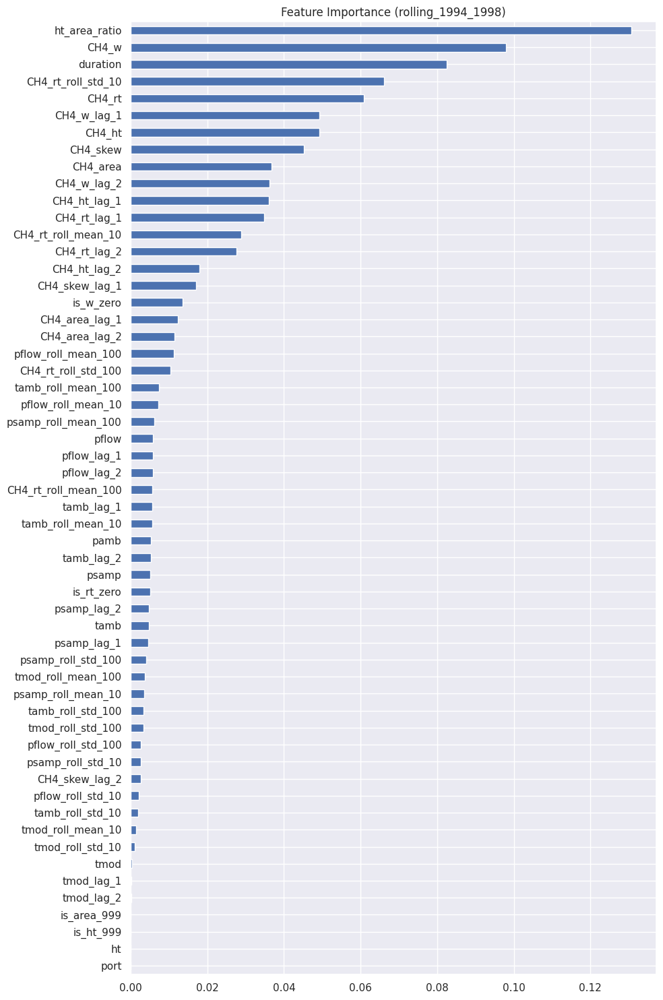

2026/06/18 18:18:56 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_project/notebooks/.venv/lib/python3.12/site-packages/mlflow/types/utils.py:440: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details."
2026/06/18 18:18:58 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_pro

Model training completed!
              precision    recall  f1-score   support

           0       0.98      0.98      0.98     12266
           1       0.53      0.49      0.51       600

    accuracy                           0.96     12866
   macro avg       0.75      0.73      0.74     12866
weighted avg       0.95      0.96      0.96     12866



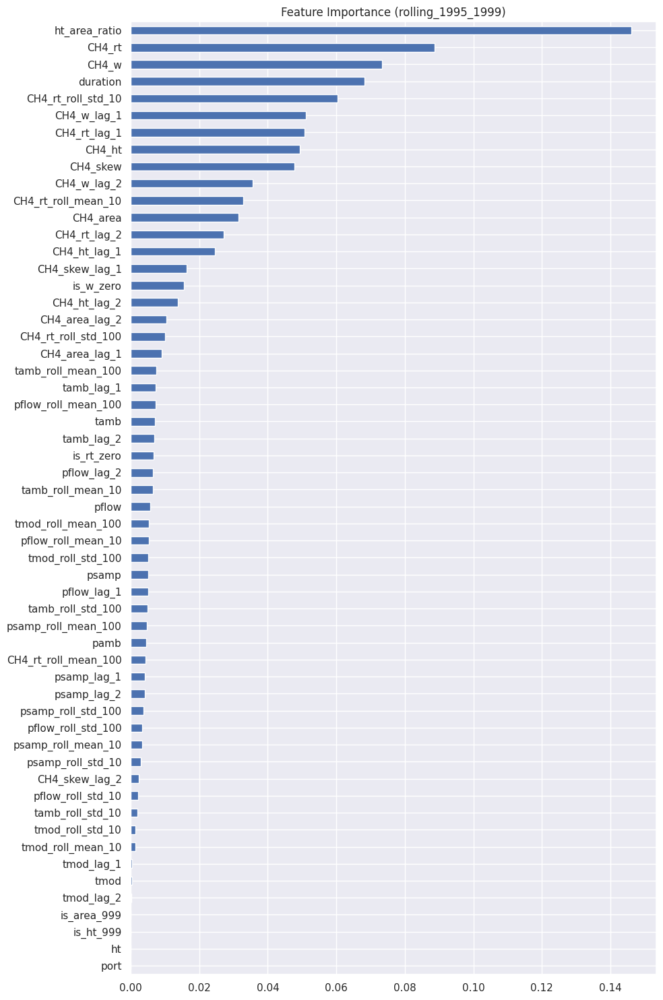

2026/06/18 18:19:11 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_project/notebooks/.venv/lib/python3.12/site-packages/mlflow/types/utils.py:440: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details."
2026/06/18 18:19:12 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_pro

Model training completed!
              precision    recall  f1-score   support

           0       0.99      1.00      0.99     12711
           1       0.98      0.46      0.63       284

    accuracy                           0.99     12995
   macro avg       0.98      0.73      0.81     12995
weighted avg       0.99      0.99      0.99     12995



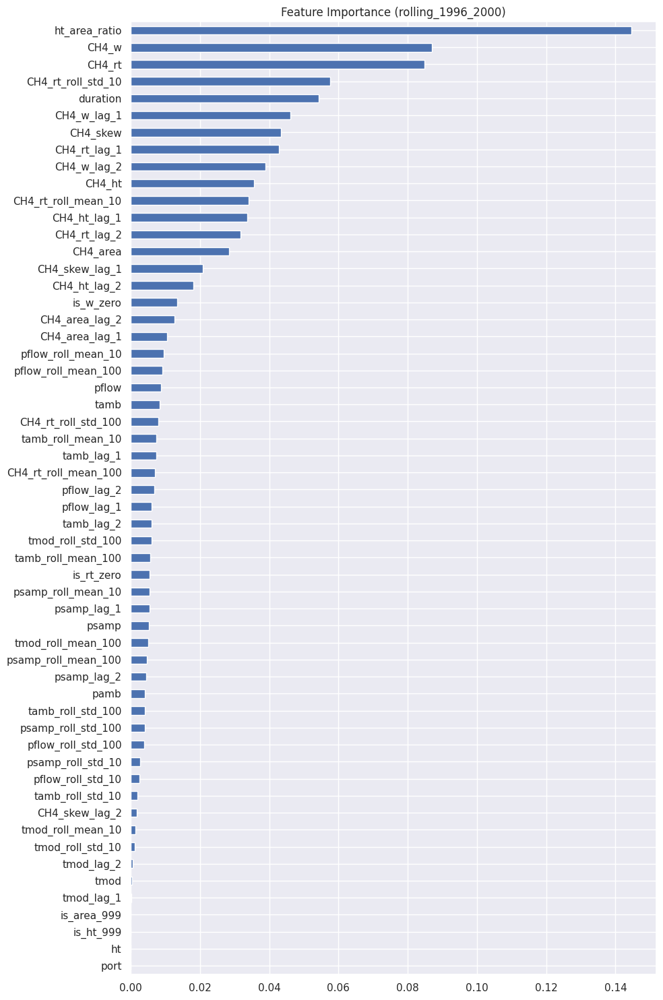

2026/06/18 18:19:26 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_project/notebooks/.venv/lib/python3.12/site-packages/mlflow/types/utils.py:440: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details."
2026/06/18 18:19:28 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_pro

Model training completed!
              precision    recall  f1-score   support

           0       0.99      1.00      1.00     12525
           1       0.99      0.72      0.83       373

    accuracy                           0.99     12898
   macro avg       0.99      0.86      0.91     12898
weighted avg       0.99      0.99      0.99     12898



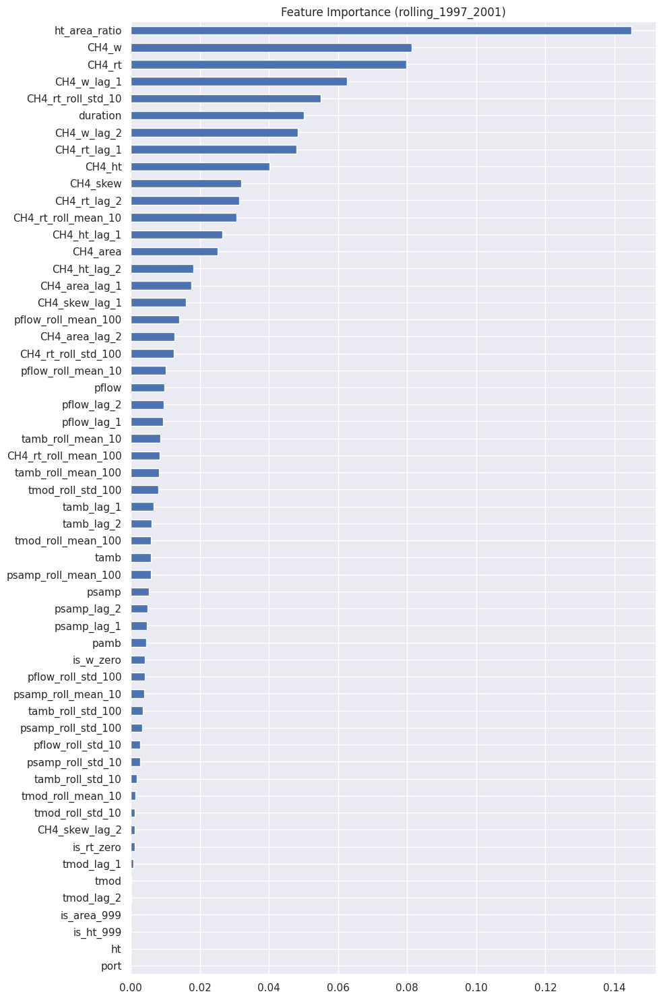

2026/06/18 18:19:41 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_project/notebooks/.venv/lib/python3.12/site-packages/mlflow/types/utils.py:440: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details."
2026/06/18 18:19:42 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_pro

Model training completed!
              precision    recall  f1-score   support

           0       0.99      1.00      0.99     12564
           1       0.99      0.59      0.74       416

    accuracy                           0.99     12980
   macro avg       0.99      0.79      0.87     12980
weighted avg       0.99      0.99      0.98     12980



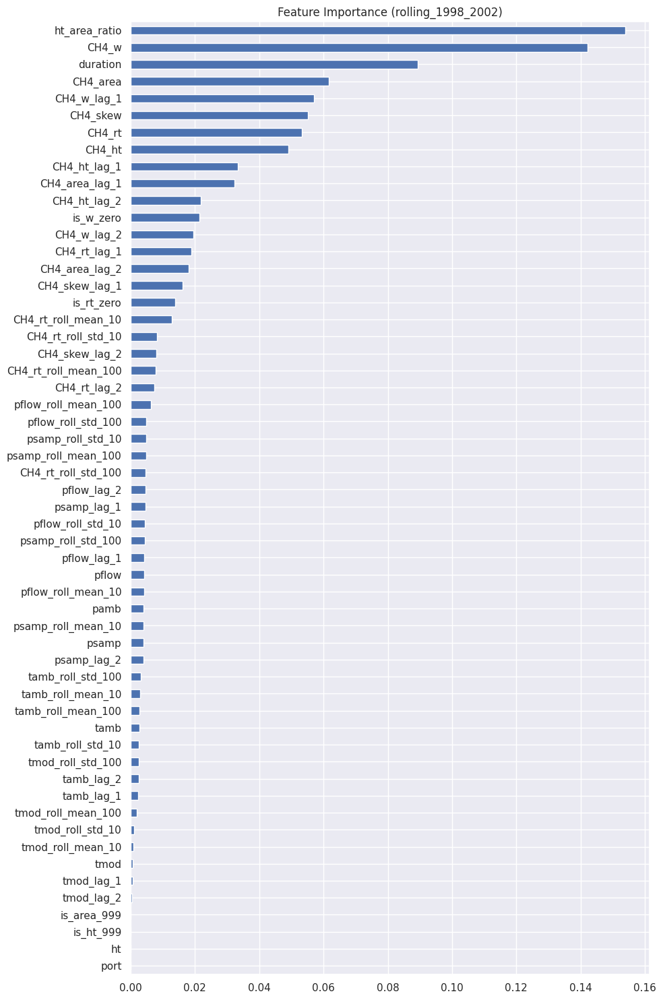

2026/06/18 18:19:56 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_project/notebooks/.venv/lib/python3.12/site-packages/mlflow/types/utils.py:440: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details."
2026/06/18 18:19:58 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_pro

Model training completed!
              precision    recall  f1-score   support

           0       0.99      0.99      0.99     12472
           1       0.71      0.64      0.67       412

    accuracy                           0.98     12884
   macro avg       0.85      0.81      0.83     12884
weighted avg       0.98      0.98      0.98     12884



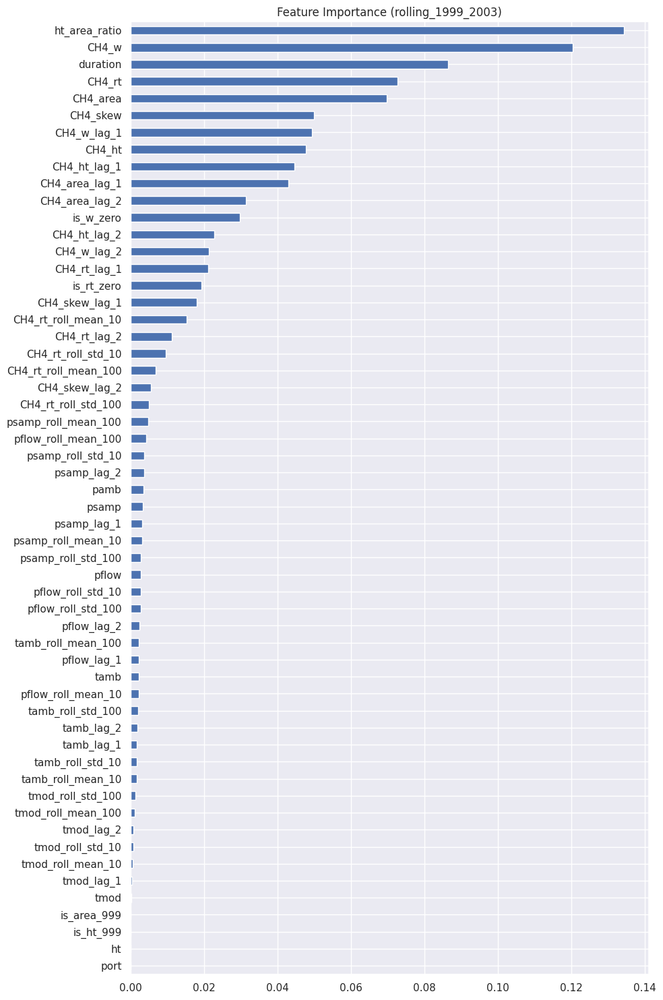

2026/06/18 18:20:11 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_project/notebooks/.venv/lib/python3.12/site-packages/mlflow/types/utils.py:440: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details."
2026/06/18 18:20:12 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_pro

Model training completed!
              precision    recall  f1-score   support

           0       0.99      0.66      0.79     12271
           1       0.11      0.90      0.20       598

    accuracy                           0.67     12869
   macro avg       0.55      0.78      0.50     12869
weighted avg       0.95      0.67      0.76     12869



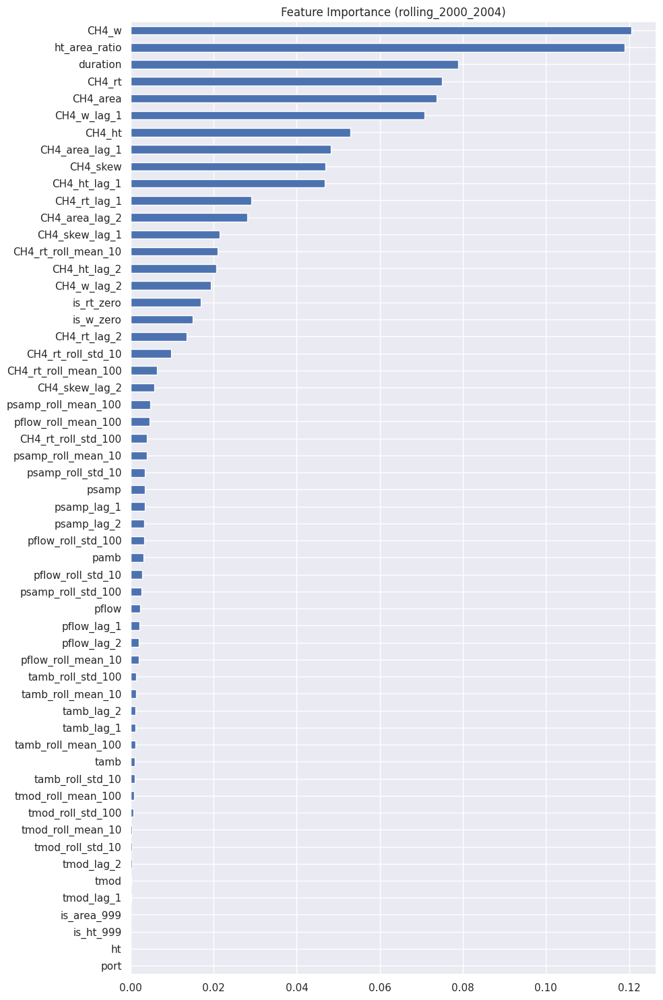

2026/06/18 18:20:25 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_project/notebooks/.venv/lib/python3.12/site-packages/mlflow/types/utils.py:440: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details."
2026/06/18 18:20:27 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_pro

Model training completed!
              precision    recall  f1-score   support

           0       0.99      1.00      0.99     12301
           1       0.96      0.47      0.63       341

    accuracy                           0.99     12642
   macro avg       0.97      0.73      0.81     12642
weighted avg       0.98      0.99      0.98     12642



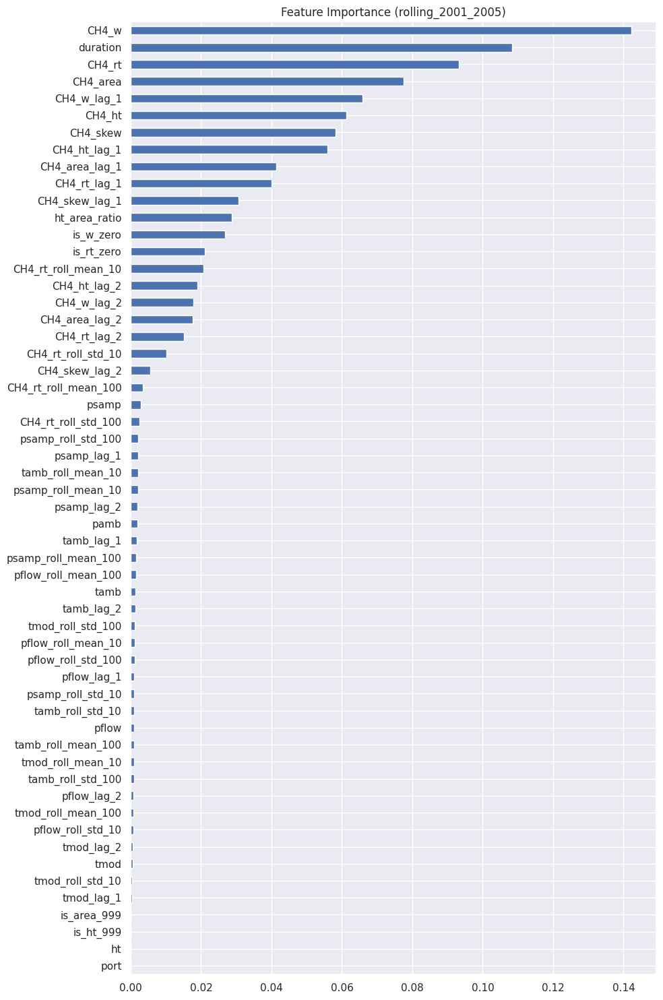

2026/06/18 18:20:46 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_project/notebooks/.venv/lib/python3.12/site-packages/mlflow/types/utils.py:440: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details."
2026/06/18 18:20:48 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_pro

Model training completed!
              precision    recall  f1-score   support

           0       0.99      1.00      1.00     12746
           1       1.00      0.69      0.82       237

    accuracy                           0.99     12983
   macro avg       1.00      0.85      0.91     12983
weighted avg       0.99      0.99      0.99     12983



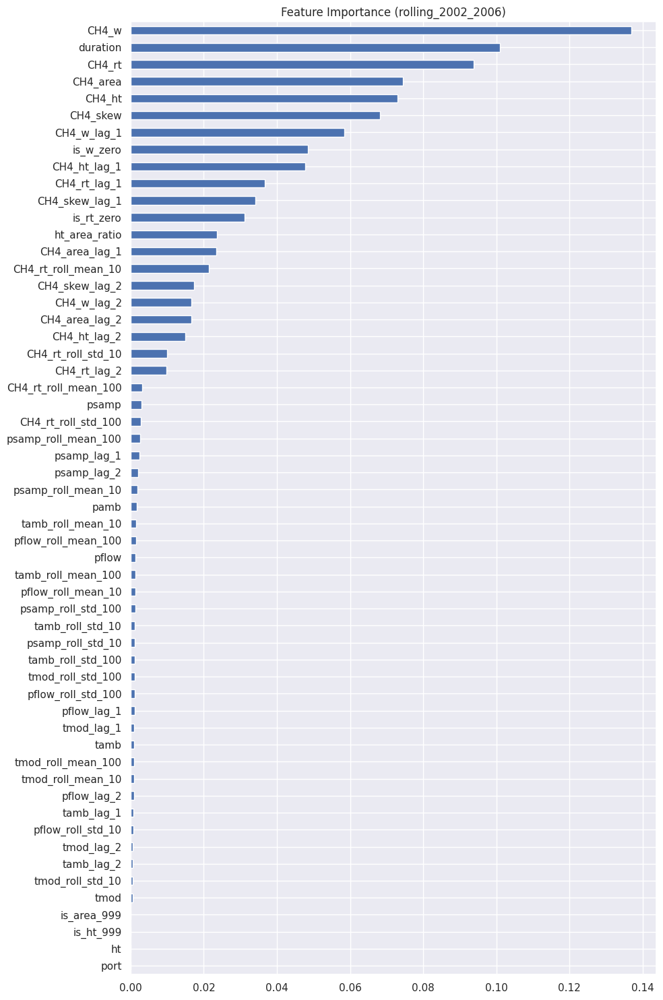

2026/06/18 18:21:06 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_project/notebooks/.venv/lib/python3.12/site-packages/mlflow/types/utils.py:440: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details."
2026/06/18 18:21:08 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_pro

Model training completed!
              precision    recall  f1-score   support

           0       0.99      0.99      0.99     12995
           1       0.36      0.31      0.34       125

    accuracy                           0.99     13120
   macro avg       0.68      0.65      0.67     13120
weighted avg       0.99      0.99      0.99     13120



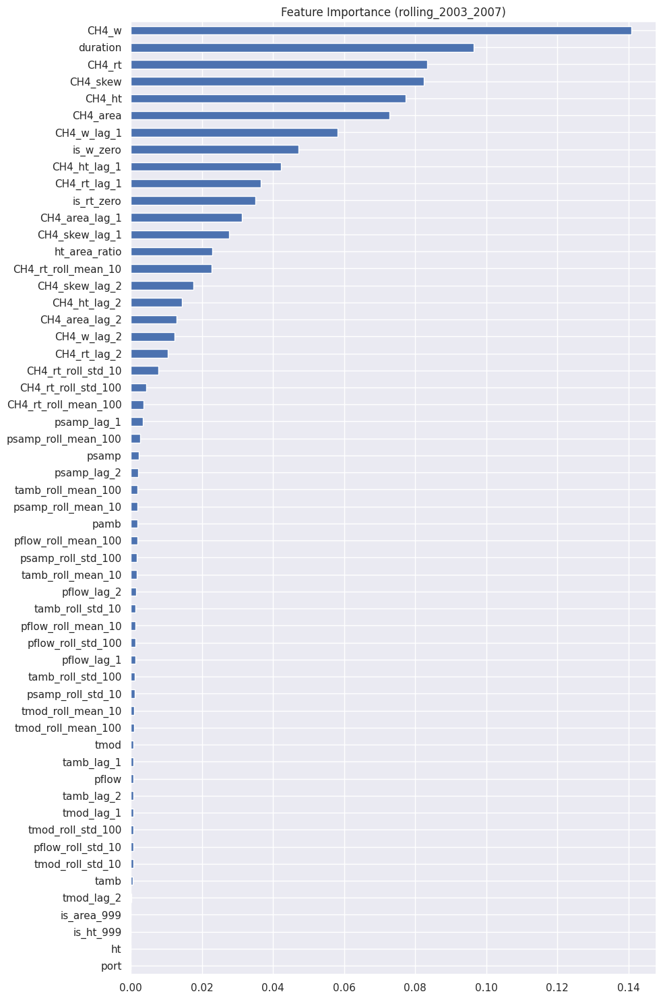

2026/06/18 18:21:26 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_project/notebooks/.venv/lib/python3.12/site-packages/mlflow/types/utils.py:440: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details."
2026/06/18 18:21:27 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_pro

Model training completed!
              precision    recall  f1-score   support

           0       0.99      1.00      1.00     13011
           1       1.00      0.01      0.02        93

    accuracy                           0.99     13104
   macro avg       1.00      0.51      0.51     13104
weighted avg       0.99      0.99      0.99     13104



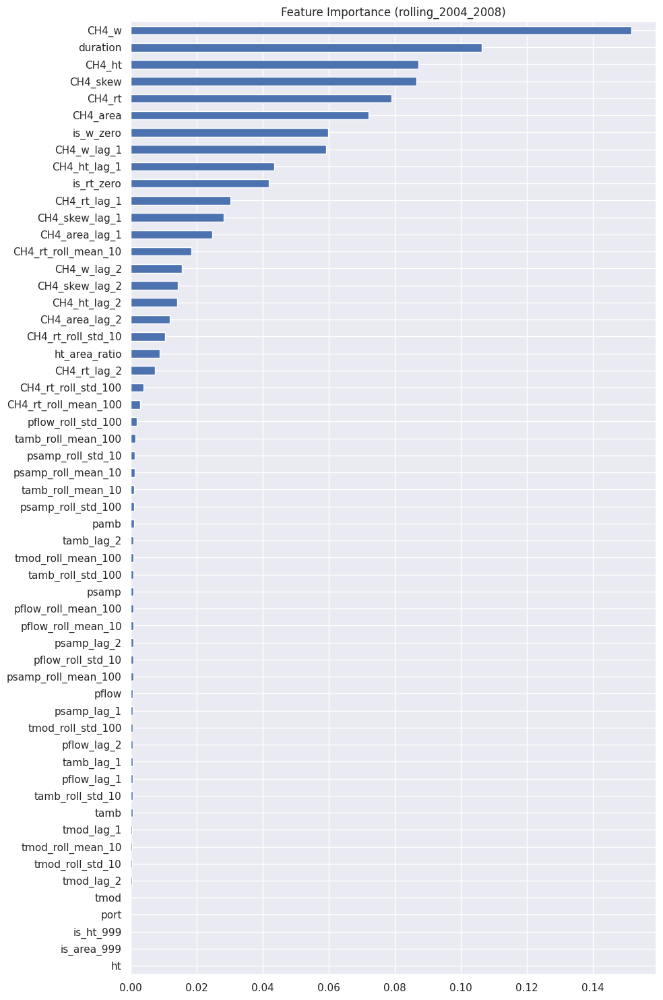

2026/06/18 18:21:44 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_project/notebooks/.venv/lib/python3.12/site-packages/mlflow/types/utils.py:440: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details."
2026/06/18 18:21:45 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_pro

Model training completed!
              precision    recall  f1-score   support

           0       0.99      1.00      1.00     12847
           1       1.00      0.46      0.63       156

    accuracy                           0.99     13003
   macro avg       1.00      0.73      0.81     13003
weighted avg       0.99      0.99      0.99     13003



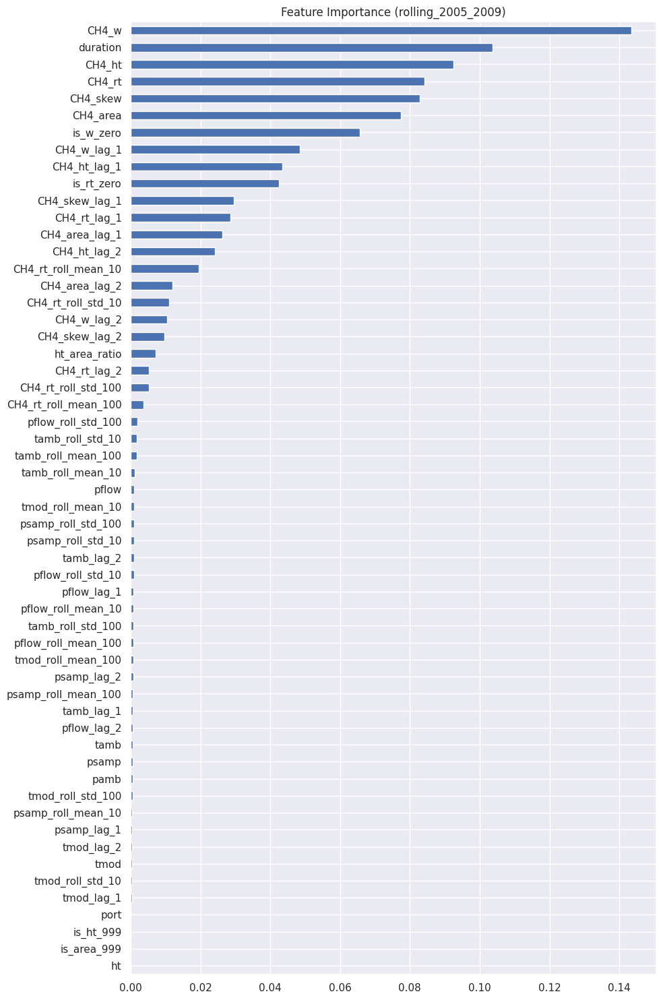

2026/06/18 18:22:02 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_project/notebooks/.venv/lib/python3.12/site-packages/mlflow/types/utils.py:440: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details."
2026/06/18 18:22:04 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_pro

Model training completed!
              precision    recall  f1-score   support

           0       0.99      0.14      0.24     13050
           1       0.01      0.90      0.02       100

    accuracy                           0.15     13150
   macro avg       0.50      0.52      0.13     13150
weighted avg       0.99      0.15      0.24     13150



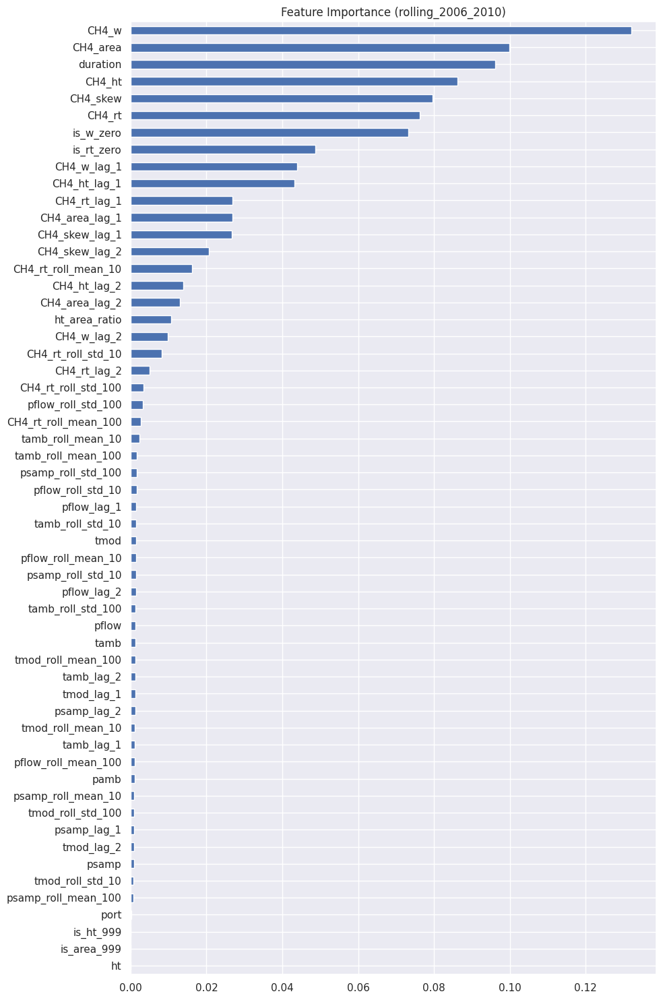

2026/06/18 18:22:21 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_project/notebooks/.venv/lib/python3.12/site-packages/mlflow/types/utils.py:440: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details."
2026/06/18 18:22:23 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_pro

Model training completed!
              precision    recall  f1-score   support

           0       0.97      1.00      0.99     12546
           1       1.00      0.28      0.44       517

    accuracy                           0.97     13063
   macro avg       0.99      0.64      0.71     13063
weighted avg       0.97      0.97      0.96     13063



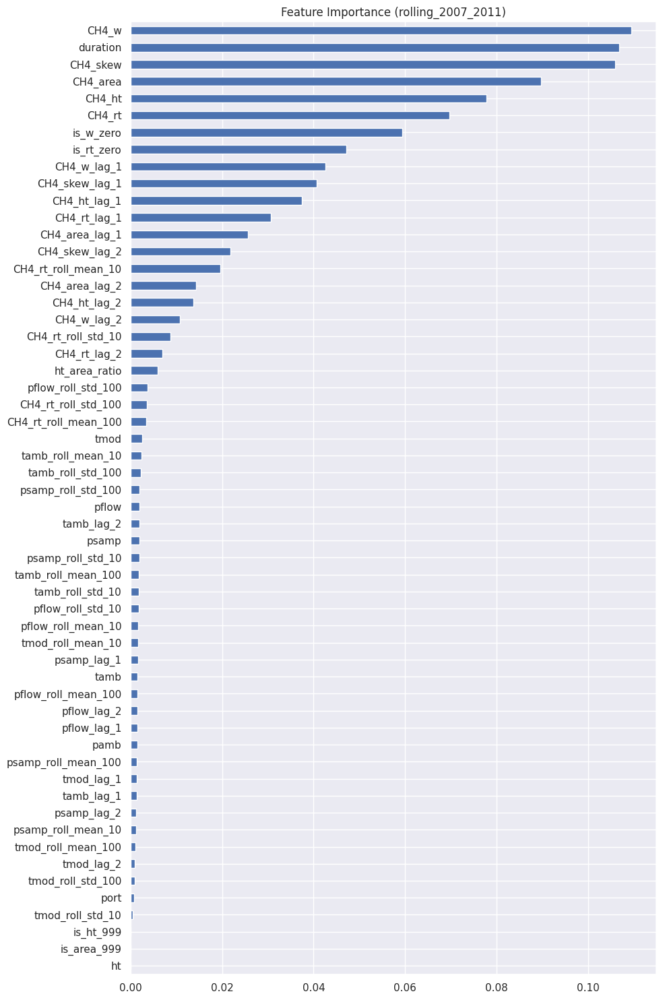

2026/06/18 18:22:39 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_project/notebooks/.venv/lib/python3.12/site-packages/mlflow/types/utils.py:440: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details."
2026/06/18 18:22:41 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_pro

Model training completed!
              precision    recall  f1-score   support

           0       0.99      1.00      1.00     12765
           1       0.99      0.67      0.80       339

    accuracy                           0.99     13104
   macro avg       0.99      0.84      0.90     13104
weighted avg       0.99      0.99      0.99     13104



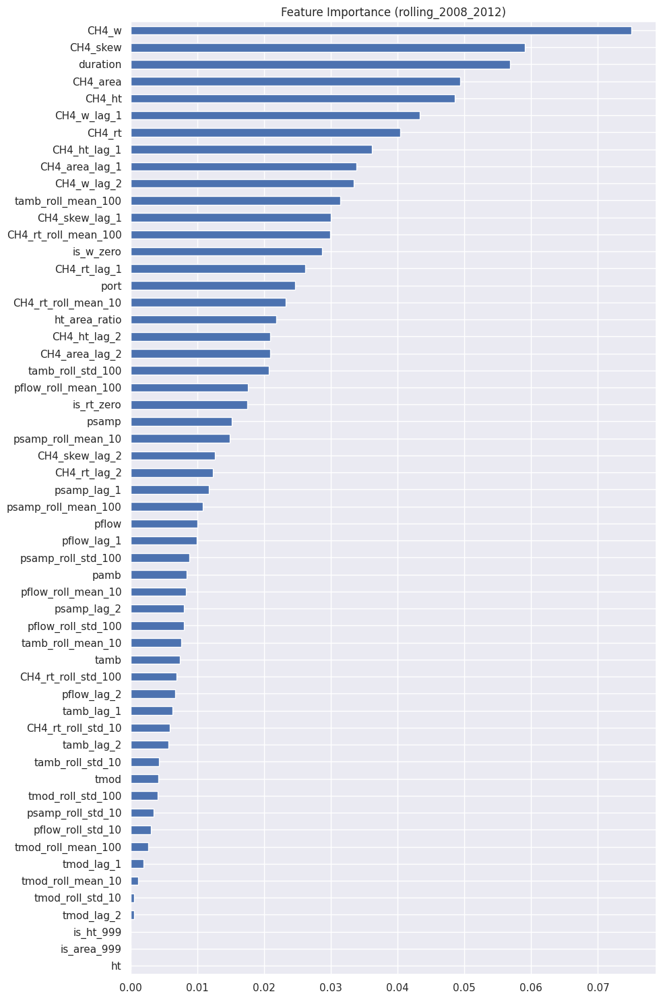

2026/06/18 18:22:58 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_project/notebooks/.venv/lib/python3.12/site-packages/mlflow/types/utils.py:440: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details."
2026/06/18 18:23:00 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_pro

Model training completed!
              precision    recall  f1-score   support

           0       0.99      1.00      1.00     11462
           1       0.99      0.95      0.97      1617

    accuracy                           0.99     13079
   macro avg       0.99      0.97      0.98     13079
weighted avg       0.99      0.99      0.99     13079



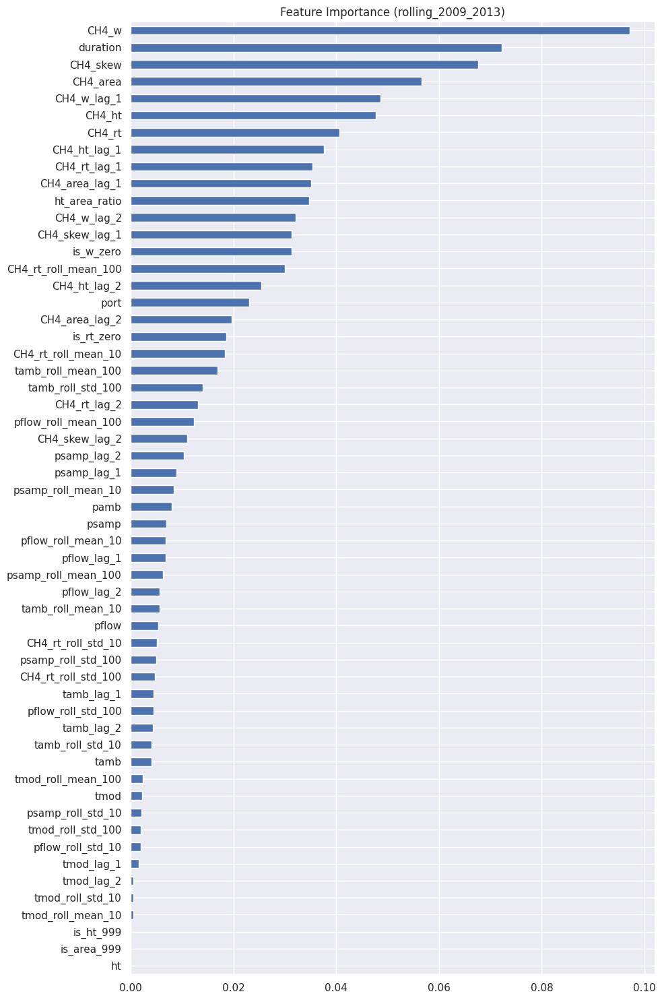

2026/06/18 18:23:17 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_project/notebooks/.venv/lib/python3.12/site-packages/mlflow/types/utils.py:440: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details."
2026/06/18 18:23:19 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_pro

Model training completed!
              precision    recall  f1-score   support

           0       0.99      1.00      1.00     12689
           1       0.50      0.01      0.03        74

    accuracy                           0.99     12763
   macro avg       0.75      0.51      0.51     12763
weighted avg       0.99      0.99      0.99     12763



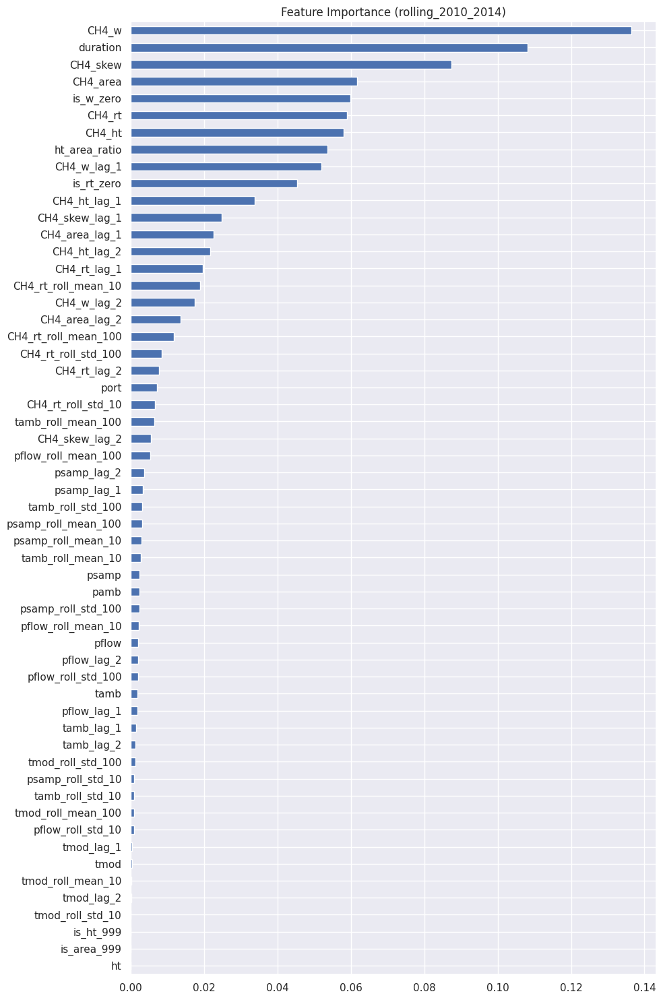

2026/06/18 18:23:35 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_project/notebooks/.venv/lib/python3.12/site-packages/mlflow/types/utils.py:440: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details."
2026/06/18 18:23:37 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_pro

Model training completed!
              precision    recall  f1-score   support

           0       0.98      1.00      0.99     12791
           1       1.00      0.23      0.37       274

    accuracy                           0.98     13065
   macro avg       0.99      0.61      0.68     13065
weighted avg       0.98      0.98      0.98     13065



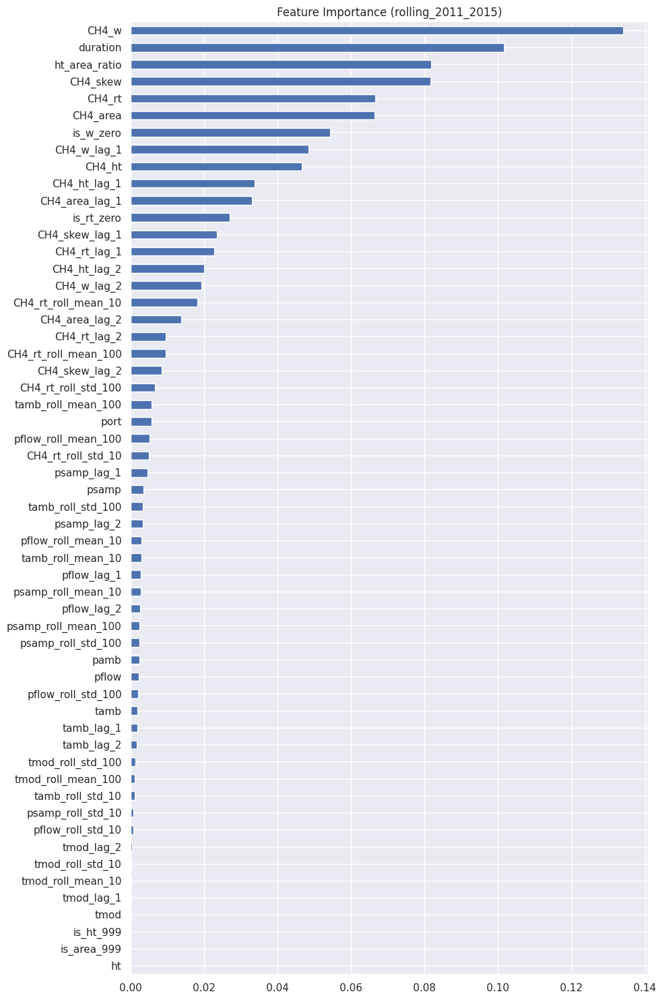

2026/06/18 18:23:53 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_project/notebooks/.venv/lib/python3.12/site-packages/mlflow/types/utils.py:440: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details."
2026/06/18 18:23:56 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_pro

Model training completed!
              precision    recall  f1-score   support

           0       0.98      0.89      0.93     12636
           1       0.05      0.22      0.09       353

    accuracy                           0.87     12989
   macro avg       0.51      0.56      0.51     12989
weighted avg       0.95      0.87      0.91     12989



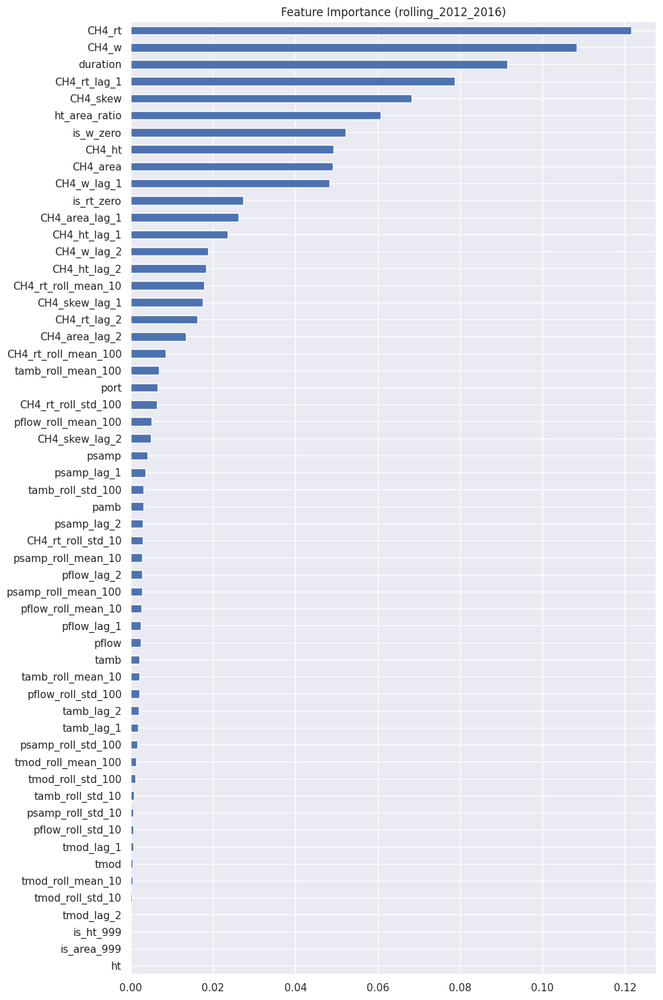

2026/06/18 18:24:12 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_project/notebooks/.venv/lib/python3.12/site-packages/mlflow/types/utils.py:440: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details."
2026/06/18 18:24:17 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_pro

Model training completed!
              precision    recall  f1-score   support

           0       0.97      0.35      0.51     12027
           1       0.05      0.78      0.10       547

    accuracy                           0.37     12574
   macro avg       0.51      0.56      0.30     12574
weighted avg       0.93      0.37      0.49     12574



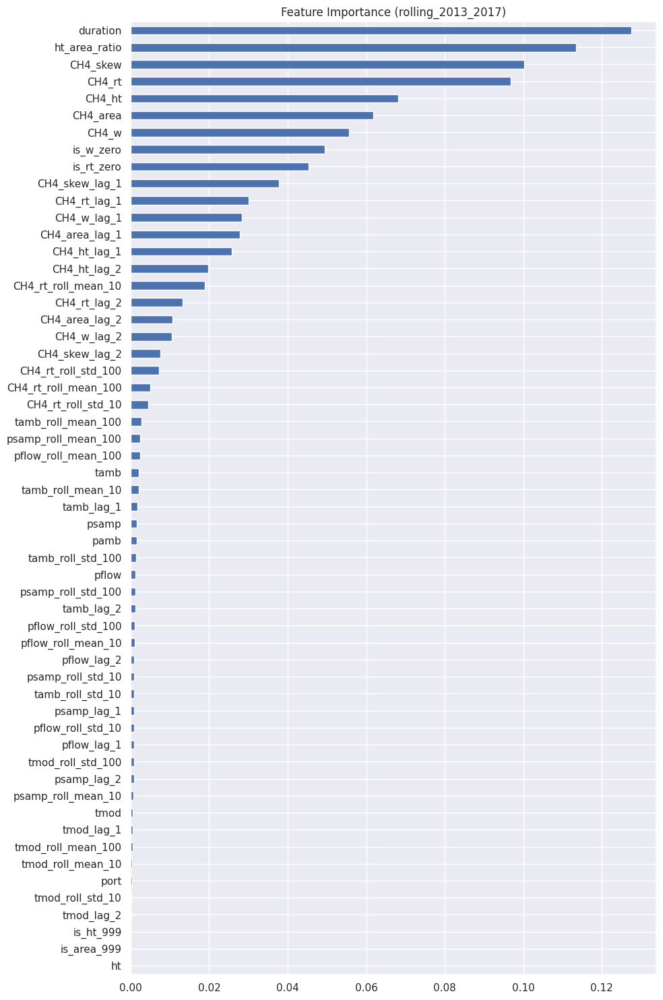

2026/06/18 18:49:34 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_project/notebooks/.venv/lib/python3.12/site-packages/mlflow/types/utils.py:440: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details."
2026/06/18 18:49:37 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_pro

Model training completed!
              precision    recall  f1-score   support

           0       0.98      0.99      0.99     12419
           1       0.76      0.49      0.59       519

    accuracy                           0.97     12938
   macro avg       0.87      0.74      0.79     12938
weighted avg       0.97      0.97      0.97     12938



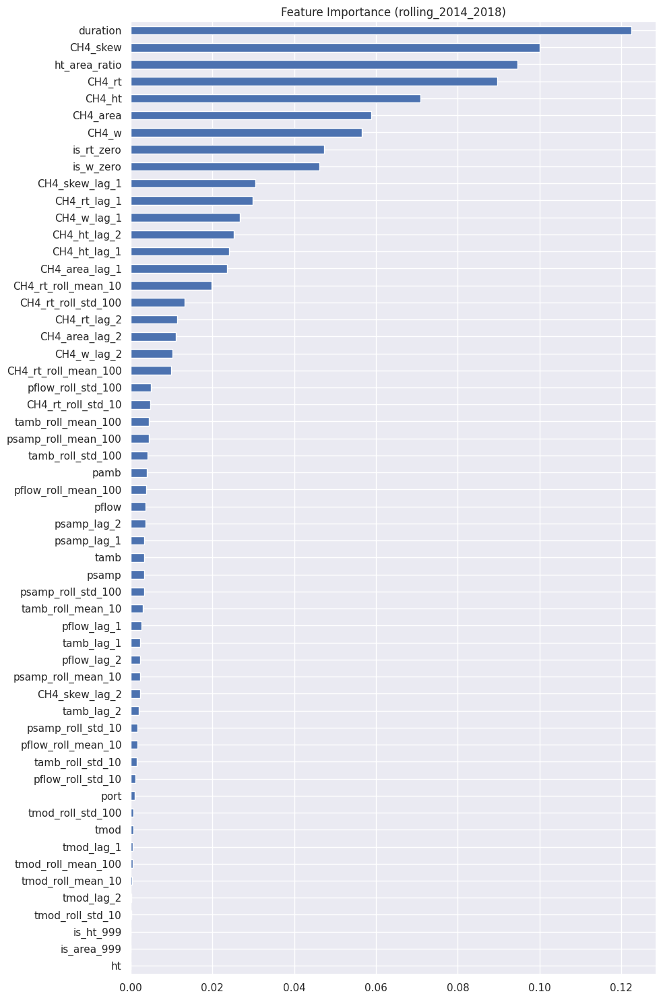

2026/06/18 18:49:55 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_project/notebooks/.venv/lib/python3.12/site-packages/mlflow/types/utils.py:440: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details."
2026/06/18 18:49:57 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_pro

Model training completed!
              precision    recall  f1-score   support

           0       0.89      0.57      0.69      8186
           1       0.53      0.88      0.66      4546

    accuracy                           0.68     12732
   macro avg       0.71      0.72      0.68     12732
weighted avg       0.76      0.68      0.68     12732



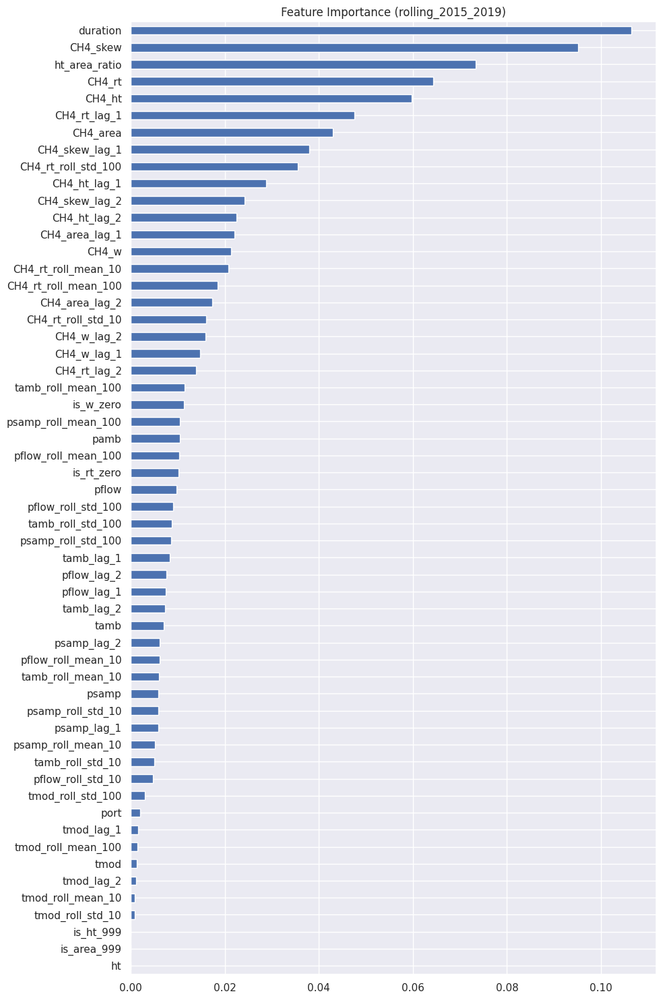

2026/06/18 18:50:14 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_project/notebooks/.venv/lib/python3.12/site-packages/mlflow/types/utils.py:440: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details."
2026/06/18 18:50:17 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_pro

Model training completed!
              precision    recall  f1-score   support

           0       0.99      0.74      0.84     12720
           1       0.04      0.53      0.08       291

    accuracy                           0.73     13011
   macro avg       0.51      0.63      0.46     13011
weighted avg       0.96      0.73      0.83     13011



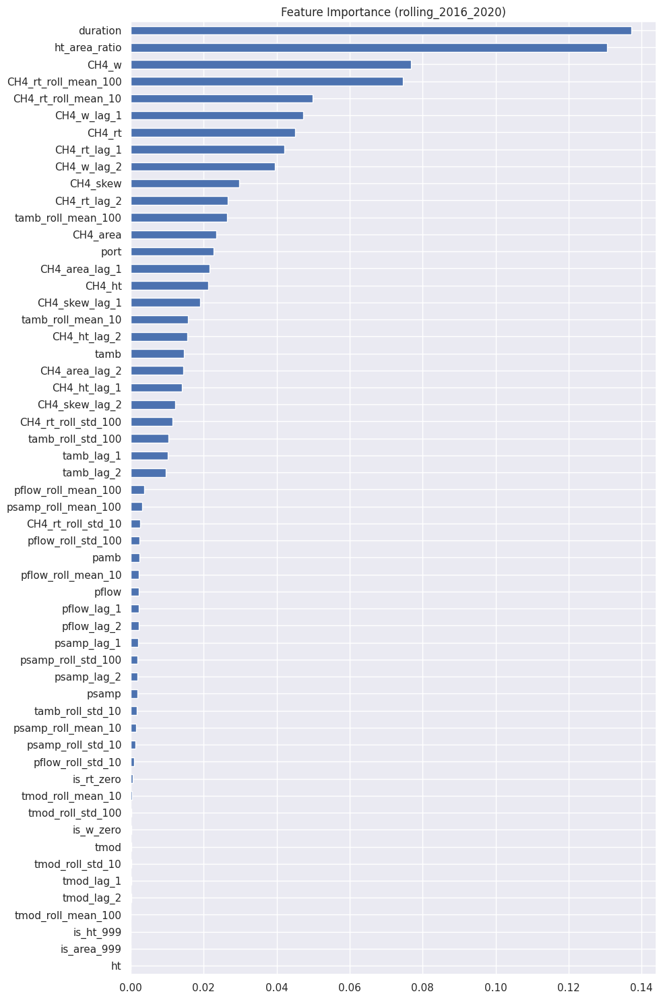

2026/06/18 18:50:34 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_project/notebooks/.venv/lib/python3.12/site-packages/mlflow/types/utils.py:440: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details."
2026/06/18 18:50:36 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_pro

Model training completed!
              precision    recall  f1-score   support

           0       0.99      0.99      0.99     11939
           1       0.65      0.71      0.68       357

    accuracy                           0.98     12296
   macro avg       0.82      0.85      0.83     12296
weighted avg       0.98      0.98      0.98     12296



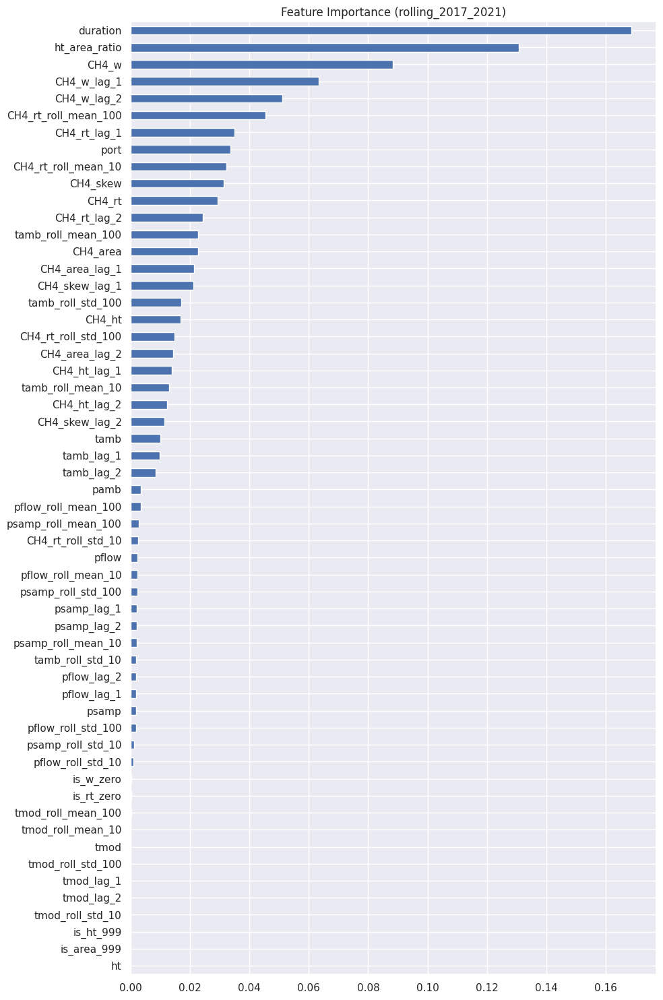

2026/06/18 18:50:53 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_project/notebooks/.venv/lib/python3.12/site-packages/mlflow/types/utils.py:440: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details."
2026/06/18 18:50:55 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_pro

Model training completed!
              precision    recall  f1-score   support

           0       0.97      0.78      0.87     10703
           1       0.44      0.89      0.59      2040

    accuracy                           0.80     12743
   macro avg       0.71      0.83      0.73     12743
weighted avg       0.89      0.80      0.82     12743



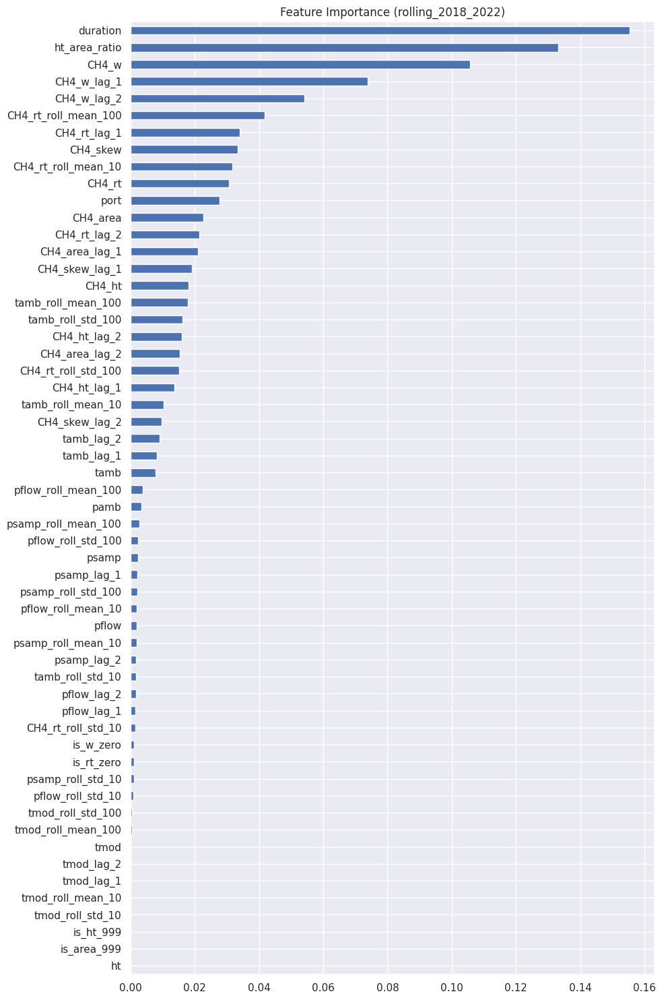

2026/06/18 18:51:10 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_project/notebooks/.venv/lib/python3.12/site-packages/mlflow/types/utils.py:440: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details."
2026/06/18 18:51:13 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_pro

Model training completed!
              precision    recall  f1-score   support

           0       0.98      1.00      0.99     12016
           1       0.95      0.13      0.23       296

    accuracy                           0.98     12312
   macro avg       0.96      0.56      0.61     12312
weighted avg       0.98      0.98      0.97     12312



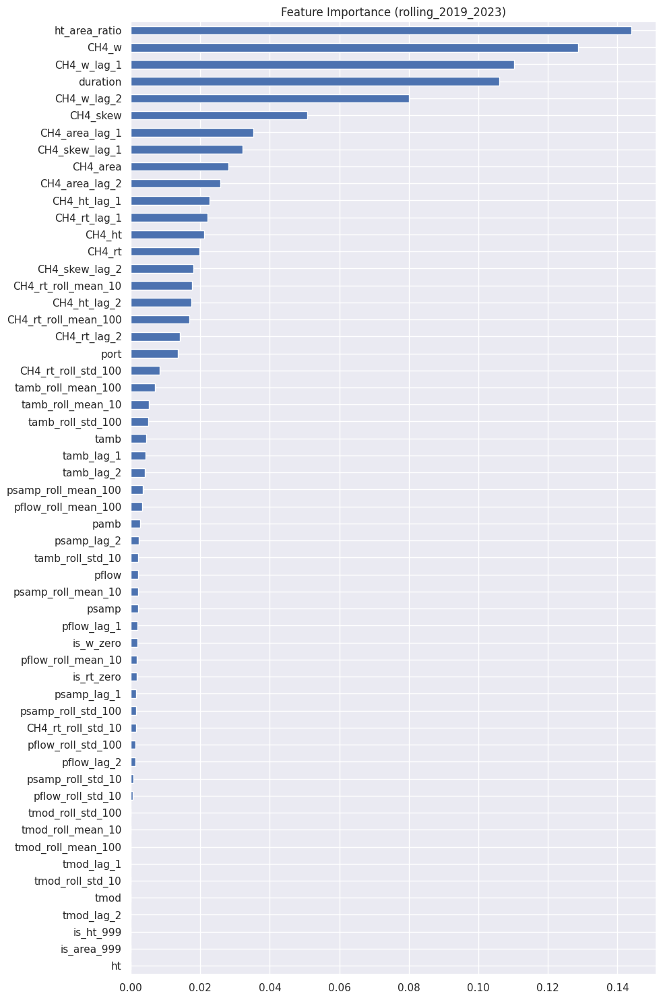

2026/06/18 18:51:29 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_project/notebooks/.venv/lib/python3.12/site-packages/mlflow/types/utils.py:440: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details."
2026/06/18 18:51:31 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_pro

Model training completed!
              precision    recall  f1-score   support

           0       0.99      1.00      1.00     12601
           1       0.96      0.59      0.73       182

    accuracy                           0.99     12783
   macro avg       0.98      0.79      0.86     12783
weighted avg       0.99      0.99      0.99     12783



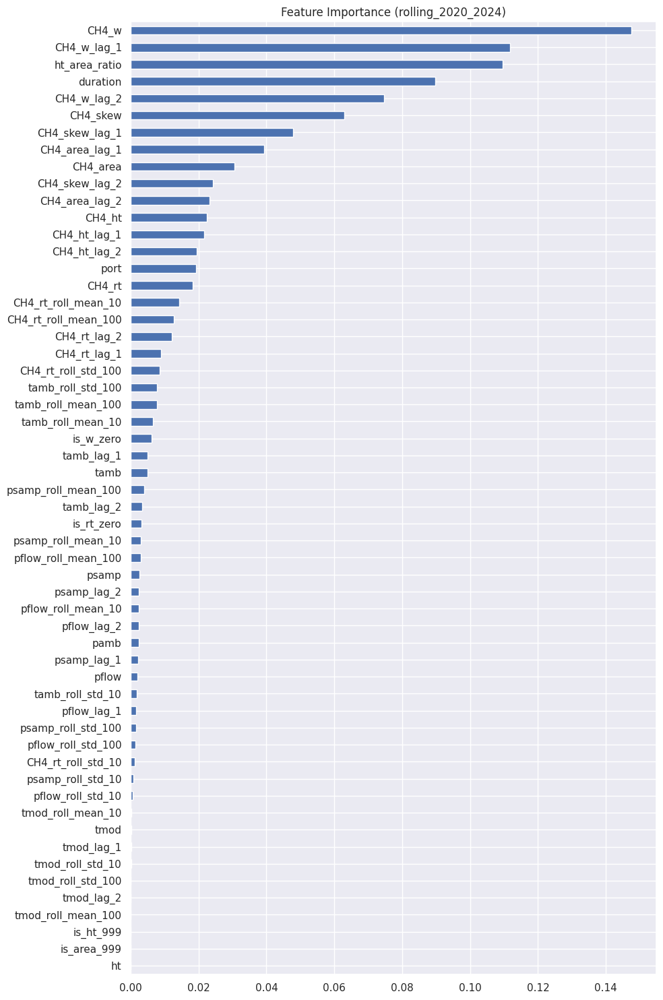

2026/06/18 18:51:47 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_project/notebooks/.venv/lib/python3.12/site-packages/mlflow/types/utils.py:440: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details."


2026 data not in the dataset


,training_years,testing year,threshold,F1-score,Precision,Recall,train_size,test_size
0,1994_1998,1999,0.480050,0.524203,0.363339,0.363339,61533,12692
1,1995_1999,2000,0.531925,0.569733,0.480000,0.480000,63319,12866
2,1996_2000,2001,0.476165,0.636792,0.475352,0.475352,63374,12995
3,1997_2001,2002,0.424836,0.835913,0.723861,0.723861,63507,12898
4,1998_2002,2003,0.233324,0.787535,0.668269,0.668269,63553,12980
5,1999_2003,2004,0.674232,0.760060,0.618932,0.618932,64431,12884
6,2000_2004,2005,0.920000,0.901745,0.821070,0.821070,64623,12869
7,2001_2005,2006,0.492446,0.629921,0.469208,0.469208,64626,12642
8,2002_2006,2007,0.371568,0.821782,0.700422,0.700422,64273,12983
9,2003_2007,2008,0.653750,0.456790,0.296000,0.296000,64358,13120


In [25]:
# std data rolling window =5
import pandas as pd
import mlflow
from sklearn.metrics import precision_recall_curve
from model import random_forest_model, best_threshold

years = sorted(std_data_v1['year'].unique()) # obtain year include
window = 5 # year, window length

all_results = []

for start_year in years:
    training_end_year = start_year + window- 1 # trainig set end year
    test_year = training_end_year + 1

    if test_year not in years:
        print(f"{test_year} data not in the dataset")
        break

    # extrac training and testing year data df
    training_df = std_data_v1[(std_data_v1['year']>=start_year) & (std_data_v1['year'] <= training_end_year)] 
    testing_df = std_data_v1[(std_data_v1['year'] == test_year)]
    #print(sorted(training_df['year'].unique()))
    #print(sorted(testing_df['year'].unique()))
    feature_cols = training_df[cols_all].columns.tolist()
    
    X_train = training_df[cols_all]
    y_train = training_df['label1']
    X_test = testing_df[cols_all]
    y_test = testing_df['label1']

    # training model
    mlflow.set_experiment(f'rolling_window_mhd_ml_std')
    model = random_forest_model(
        X_train, y_train, X_test, y_test,
        feature_names=feature_cols,
        experiment_run_name=f'rolling_{start_year}_{training_end_year}', n_estimators=200, max_depth=12, n_jobs=-1,
        threshold=0.5,class_weight=None
    )

    best_thres, best_f1, best_prec, best_rec = best_threshold(X_test, model, y_test)
    
    mlflow.log_param("training years", f"{start_year}-{training_end_year}")
    mlflow.log_param("test_year", test_year)
    mlflow.log_param("train_size", len(training_df))
    mlflow.log_param("test_size", len(testing_df))

    mlflow.log_metric("Best threshold", best_thres)
    mlflow.log_metric("Best F1-score",best_f1)
    mlflow.log_metric("Precision", best_prec)
    mlflow.log_metric("Recall", best_rec)

    all_results.append({
        "training_years": f"{start_year}_{training_end_year}",
        "testing year":test_year,
        "threshold":best_thres,
        "F1-score":best_f1,
        "Precision": best_rec,
        "Recall":best_rec,
        "train_size":len(training_df),
        "test_size":len(testing_df)
    })
rolling_results_std = pd.DataFrame(all_results)

rolling_results_std

2026/06/18 18:51:48 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_project/notebooks/.venv/lib/python3.12/site-packages/mlflow/types/utils.py:440: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details."
2026/06/18 18:51:55 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_pro

Model training completed!
              precision    recall  f1-score   support

           0       0.98      1.00      0.99     10354
           1       0.99      0.47      0.63       374

    accuracy                           0.98     10728
   macro avg       0.98      0.73      0.81     10728
weighted avg       0.98      0.98      0.98     10728



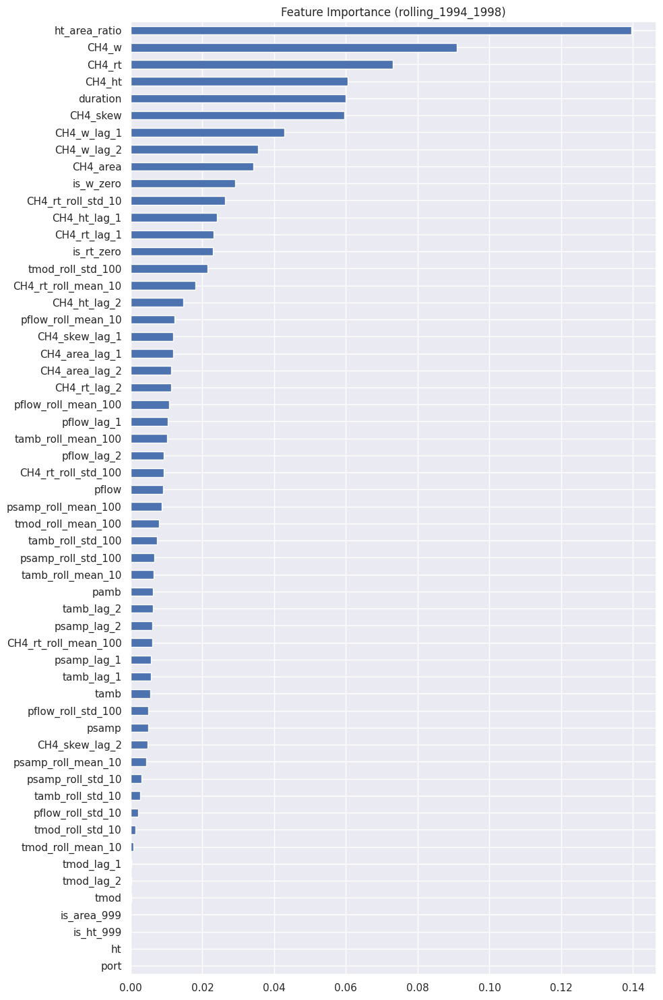

2026/06/18 18:52:04 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_project/notebooks/.venv/lib/python3.12/site-packages/mlflow/types/utils.py:440: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details."
2026/06/18 18:52:06 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_pro

Model training completed!
              precision    recall  f1-score   support

           0       0.98      1.00      0.99     10561
           1       0.99      0.44      0.61       415

    accuracy                           0.98     10976
   macro avg       0.99      0.72      0.80     10976
weighted avg       0.98      0.98      0.97     10976



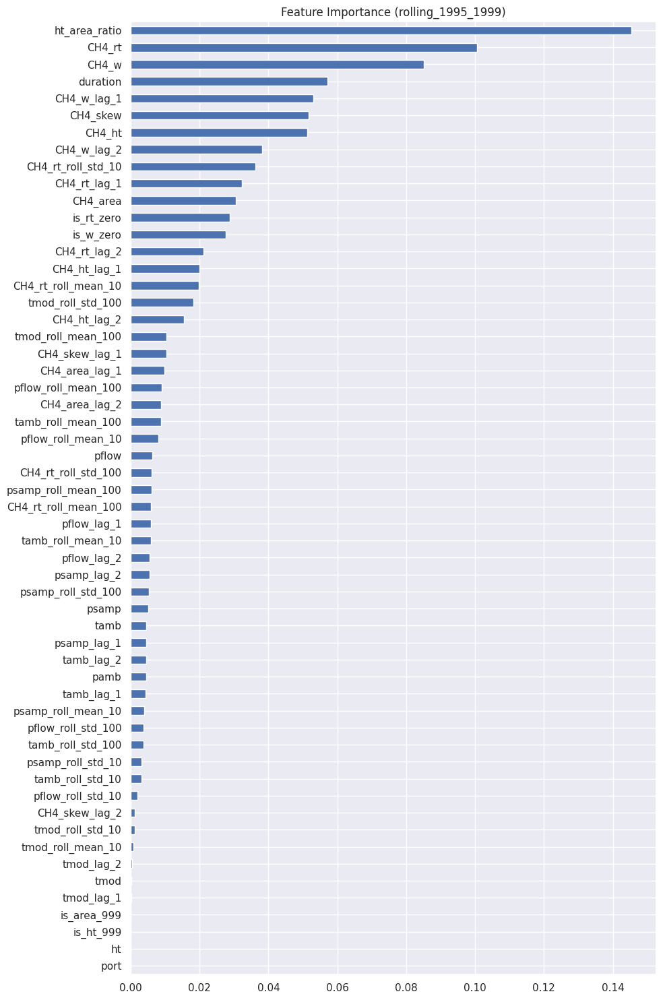

2026/06/18 18:53:14 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_project/notebooks/.venv/lib/python3.12/site-packages/mlflow/types/utils.py:440: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details."
2026/06/18 18:53:16 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_pro

Model training completed!
              precision    recall  f1-score   support

           0       0.93      1.00      0.97     10150
           1       0.99      0.13      0.23       838

    accuracy                           0.93     10988
   macro avg       0.96      0.56      0.60     10988
weighted avg       0.94      0.93      0.91     10988



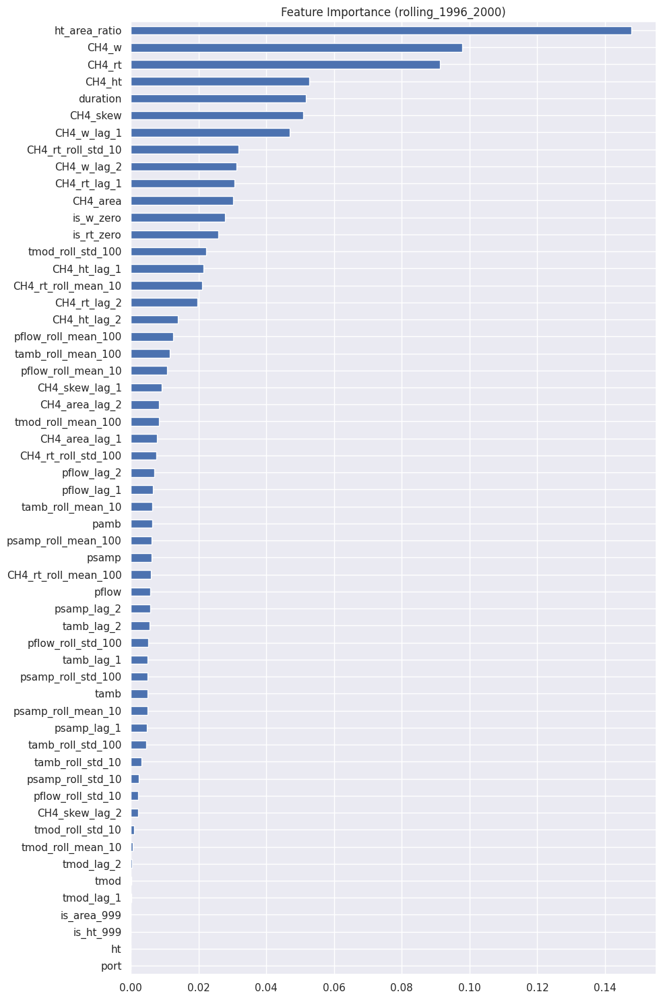

2026/06/18 18:53:34 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_project/notebooks/.venv/lib/python3.12/site-packages/mlflow/types/utils.py:440: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details."
2026/06/18 18:53:37 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_pro

Model training completed!
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     10481
           1       0.87      0.86      0.86       240

    accuracy                           0.99     10721
   macro avg       0.93      0.93      0.93     10721
weighted avg       0.99      0.99      0.99     10721



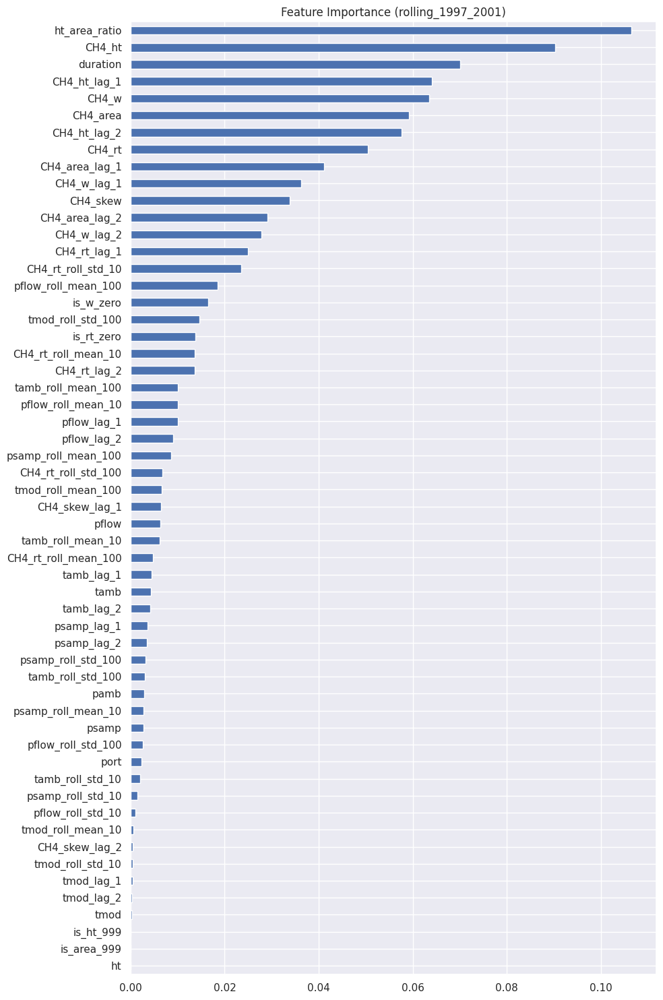

2026/06/18 18:53:53 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_project/notebooks/.venv/lib/python3.12/site-packages/mlflow/types/utils.py:440: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details."
2026/06/18 18:53:56 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_pro

Model training completed!
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     10717
           1       0.89      0.84      0.86       203

    accuracy                           1.00     10920
   macro avg       0.94      0.92      0.93     10920
weighted avg       0.99      1.00      0.99     10920



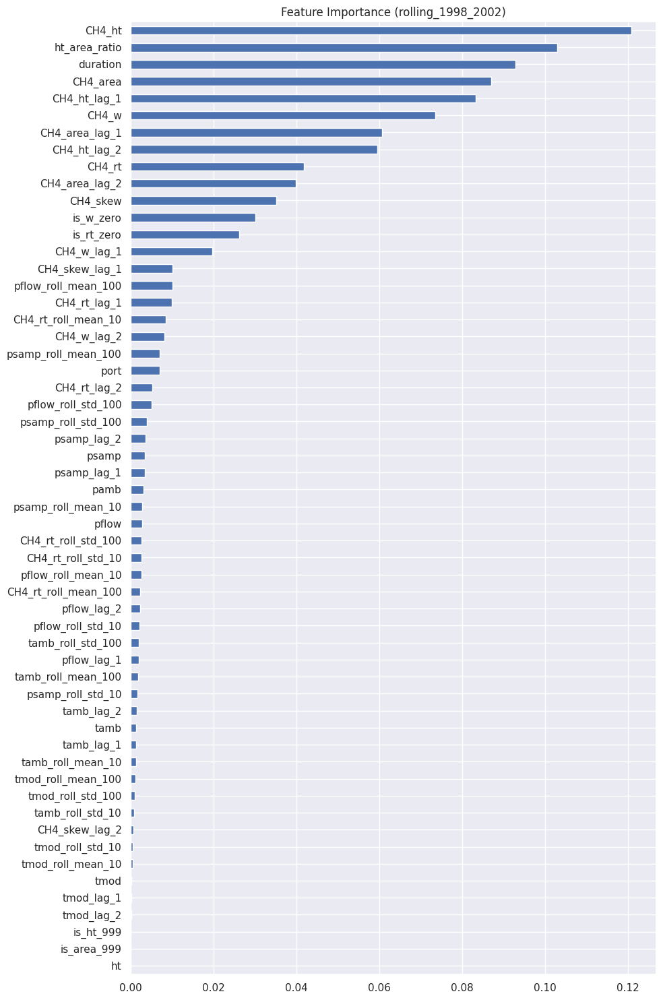

2026/06/18 18:54:14 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_project/notebooks/.venv/lib/python3.12/site-packages/mlflow/types/utils.py:440: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details."
2026/06/18 18:54:16 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_pro

Model training completed!
              precision    recall  f1-score   support

           0       0.99      1.00      1.00     10475
           1       0.94      0.77      0.85       246

    accuracy                           0.99     10721
   macro avg       0.97      0.88      0.92     10721
weighted avg       0.99      0.99      0.99     10721



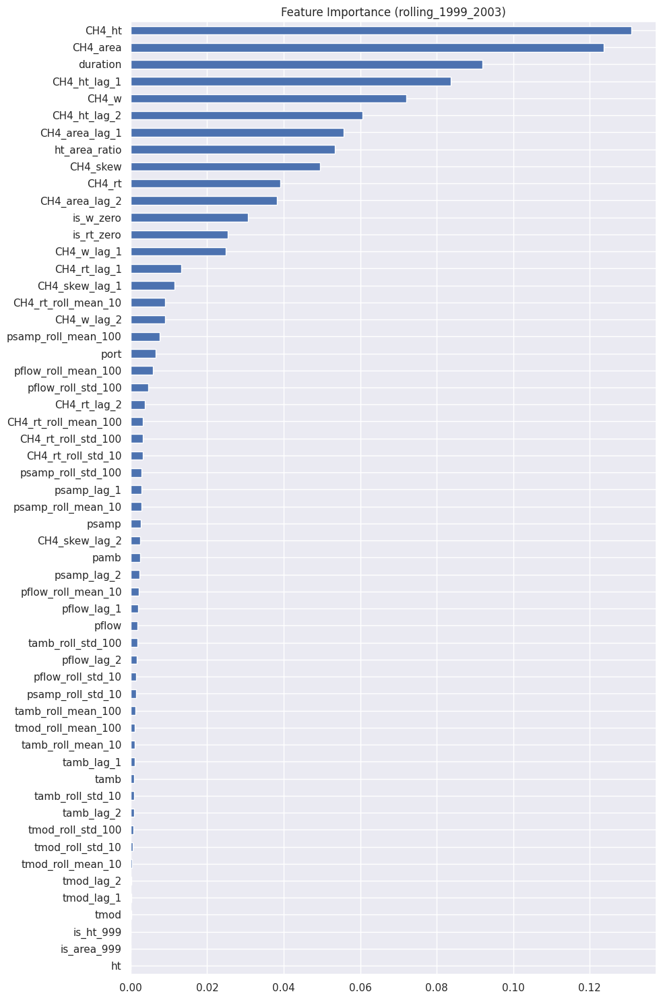

2026/06/18 18:54:33 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_project/notebooks/.venv/lib/python3.12/site-packages/mlflow/types/utils.py:440: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details."
2026/06/18 18:54:35 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_pro

Model training completed!
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     10403
           1       0.98      0.97      0.98       427

    accuracy                           1.00     10830
   macro avg       0.99      0.99      0.99     10830
weighted avg       1.00      1.00      1.00     10830



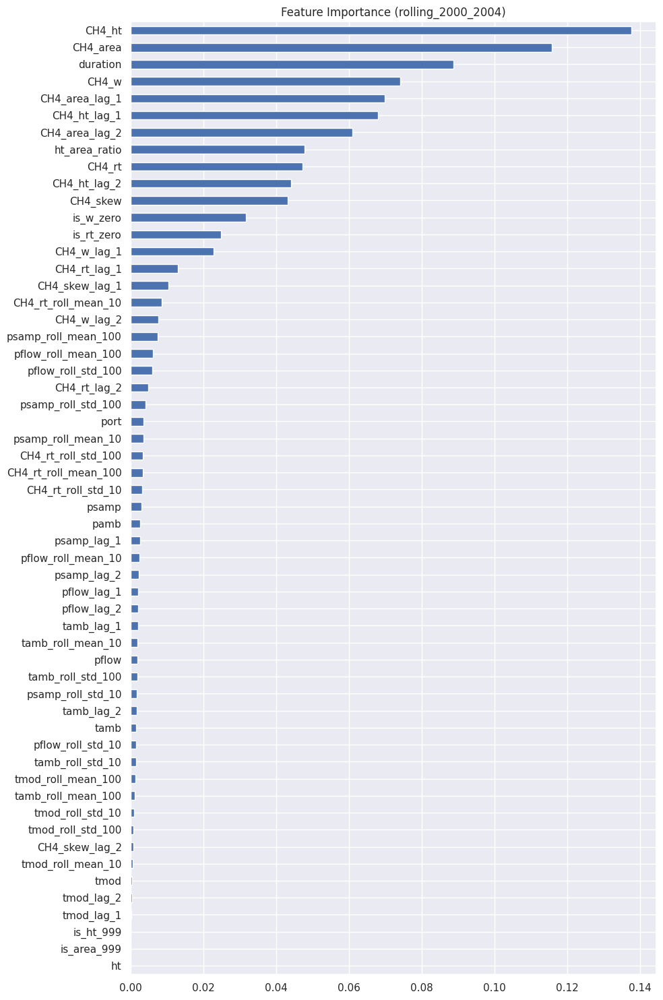

2026/06/18 18:54:53 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_project/notebooks/.venv/lib/python3.12/site-packages/mlflow/types/utils.py:440: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details."
2026/06/18 18:54:55 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_pro

Model training completed!
              precision    recall  f1-score   support

           0       0.99      1.00      1.00     10478
           1       0.99      0.59      0.74       201

    accuracy                           0.99     10679
   macro avg       0.99      0.80      0.87     10679
weighted avg       0.99      0.99      0.99     10679



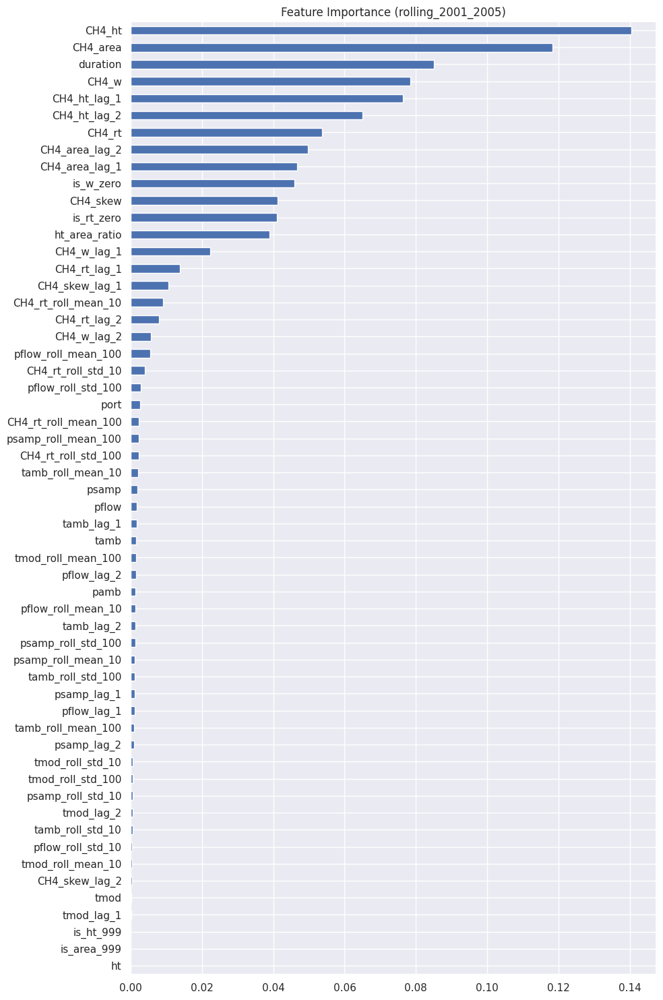

2026/06/18 18:55:12 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_project/notebooks/.venv/lib/python3.12/site-packages/mlflow/types/utils.py:440: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details."
2026/06/18 18:55:13 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_pro

Model training completed!
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     11155
           1       1.00      0.94      0.97       160

    accuracy                           1.00     11315
   macro avg       1.00      0.97      0.99     11315
weighted avg       1.00      1.00      1.00     11315



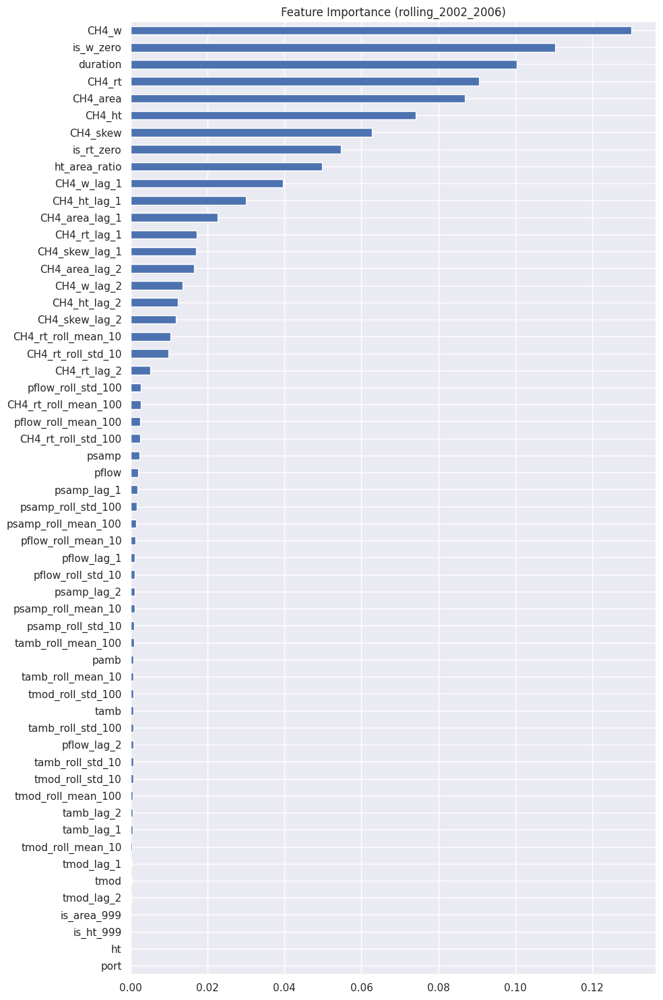

2026/06/18 18:55:30 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_project/notebooks/.venv/lib/python3.12/site-packages/mlflow/types/utils.py:440: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details."
2026/06/18 18:55:32 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_pro

Model training completed!
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     11175
           1       1.00      0.74      0.85        31

    accuracy                           1.00     11206
   macro avg       1.00      0.87      0.93     11206
weighted avg       1.00      1.00      1.00     11206



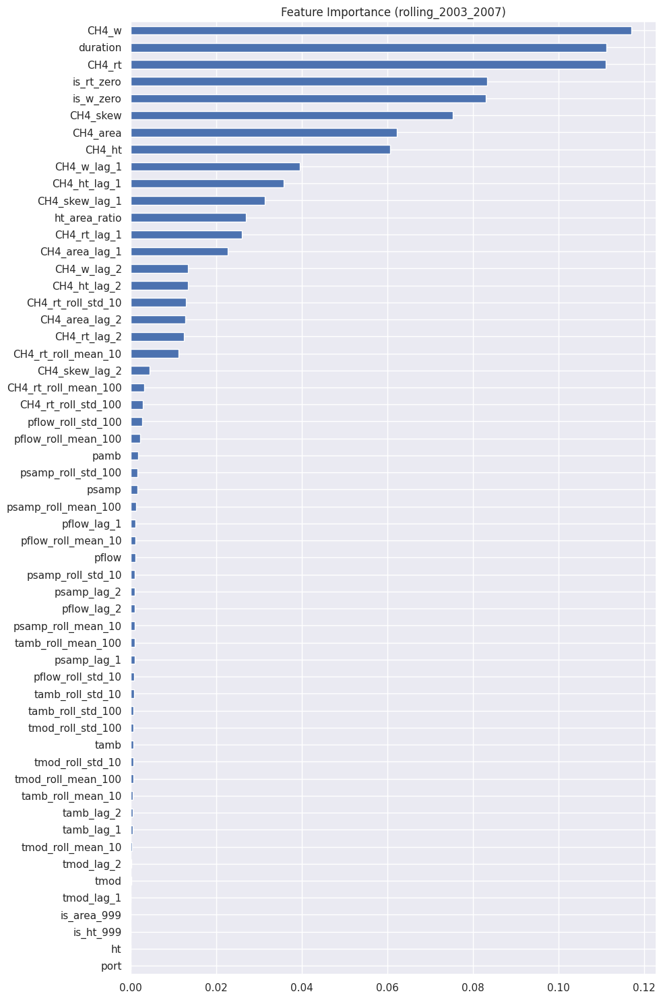

2026/06/18 18:55:49 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_project/notebooks/.venv/lib/python3.12/site-packages/mlflow/types/utils.py:440: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details."
2026/06/18 18:55:51 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_pro

Model training completed!
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     11740
           1       1.00      0.07      0.12        15

    accuracy                           1.00     11755
   macro avg       1.00      0.53      0.56     11755
weighted avg       1.00      1.00      1.00     11755



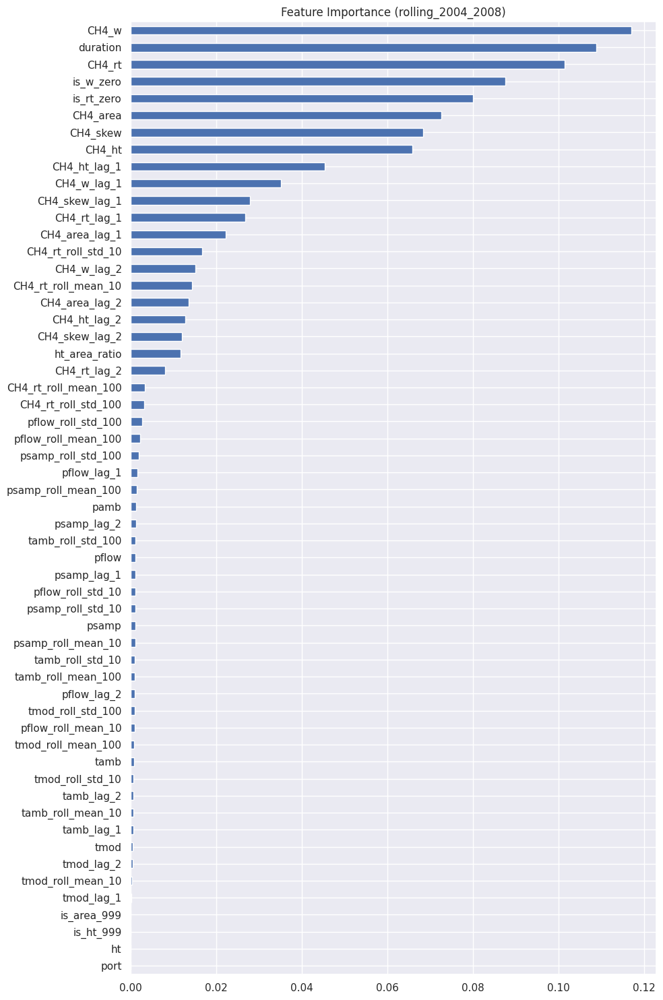

2026/06/18 18:56:07 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_project/notebooks/.venv/lib/python3.12/site-packages/mlflow/types/utils.py:440: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details."
2026/06/18 18:56:09 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_pro

Model training completed!
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     12110
           1       1.00      0.91      0.95        77

    accuracy                           1.00     12187
   macro avg       1.00      0.95      0.98     12187
weighted avg       1.00      1.00      1.00     12187



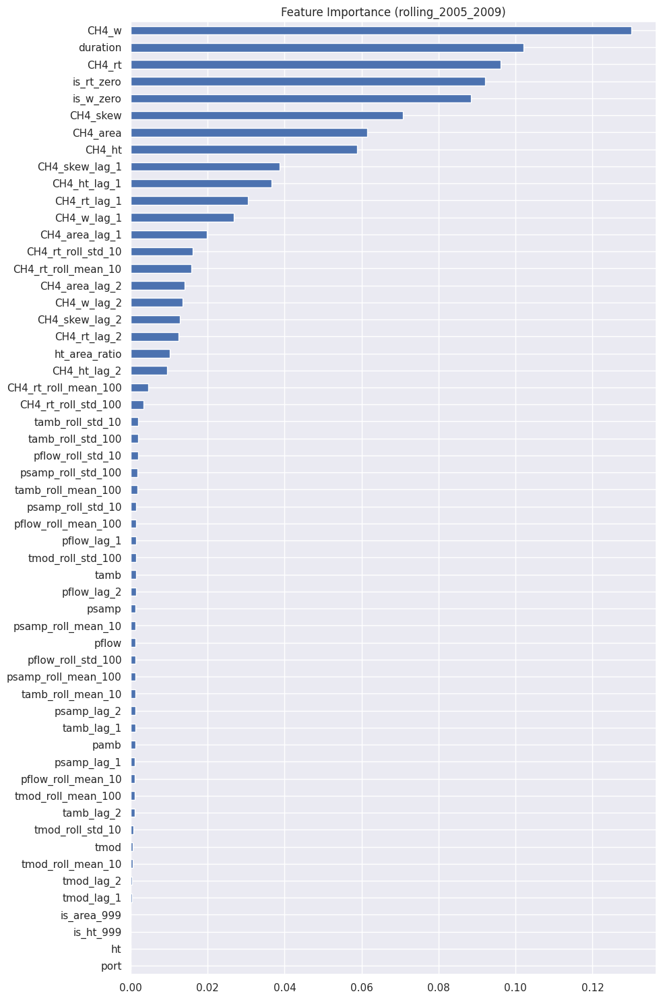

2026/06/18 18:56:27 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_project/notebooks/.venv/lib/python3.12/site-packages/mlflow/types/utils.py:440: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details."
2026/06/18 18:56:28 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_pro

Model training completed!
              precision    recall  f1-score   support

           0       1.00      0.78      0.87     12402
           1       0.00      0.12      0.00        17

    accuracy                           0.78     12419
   macro avg       0.50      0.45      0.44     12419
weighted avg       1.00      0.78      0.87     12419



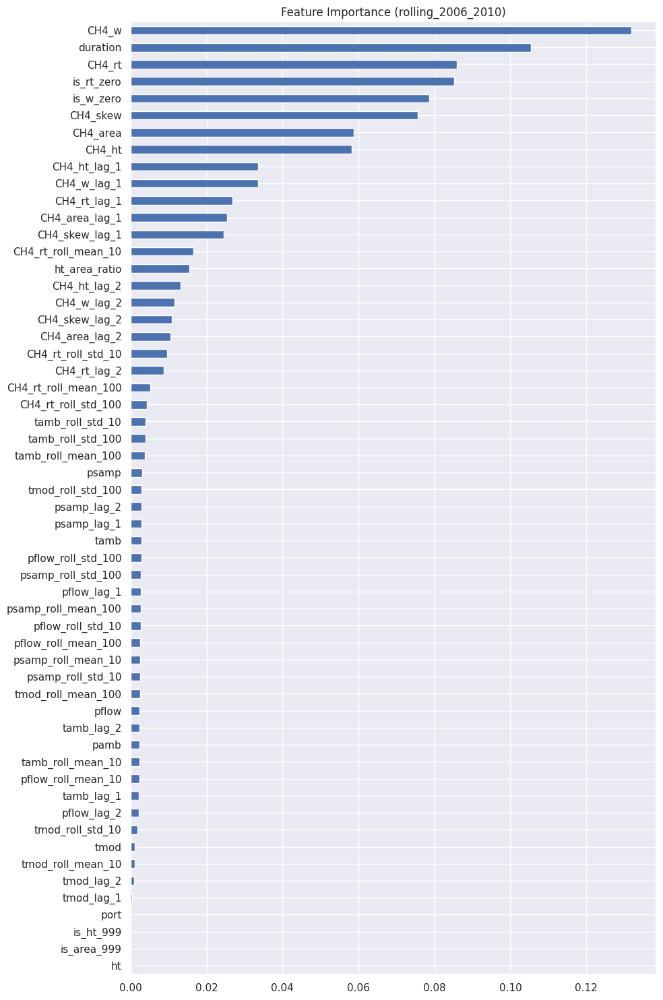

2026/06/18 18:56:46 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_project/notebooks/.venv/lib/python3.12/site-packages/mlflow/types/utils.py:440: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details."
2026/06/18 18:56:48 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_pro

Model training completed!
              precision    recall  f1-score   support

           0       0.98      1.00      0.99     11991
           1       1.00      0.35      0.52       393

    accuracy                           0.98     12384
   macro avg       0.99      0.67      0.75     12384
weighted avg       0.98      0.98      0.97     12384



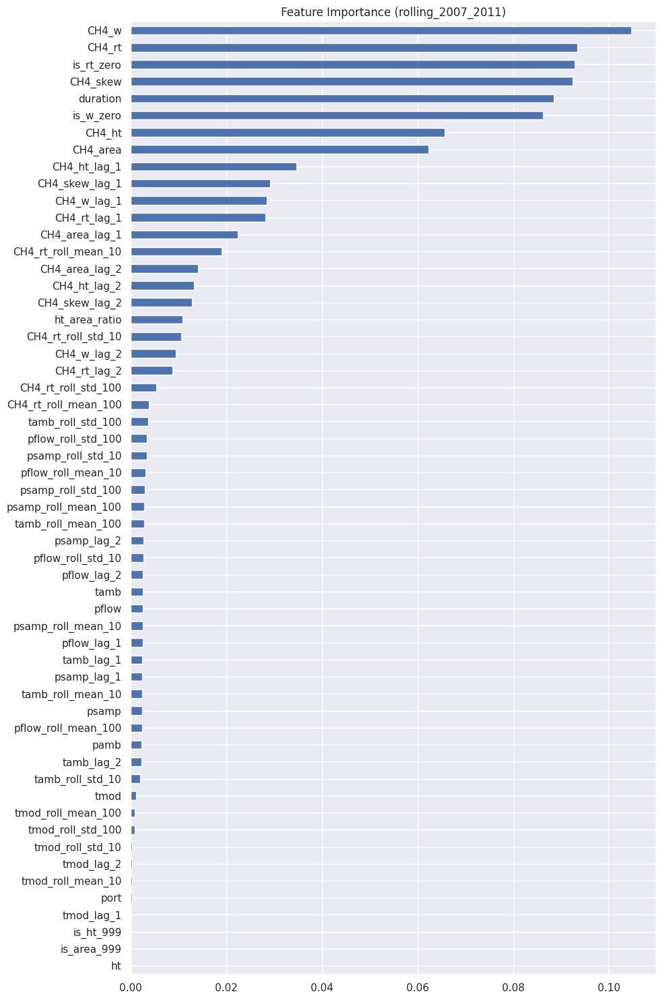

2026/06/18 18:57:06 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_project/notebooks/.venv/lib/python3.12/site-packages/mlflow/types/utils.py:440: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details."
2026/06/18 18:57:08 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_pro

Model training completed!
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     11497
           1       1.00      0.88      0.94       229

    accuracy                           1.00     11726
   macro avg       1.00      0.94      0.97     11726
weighted avg       1.00      1.00      1.00     11726



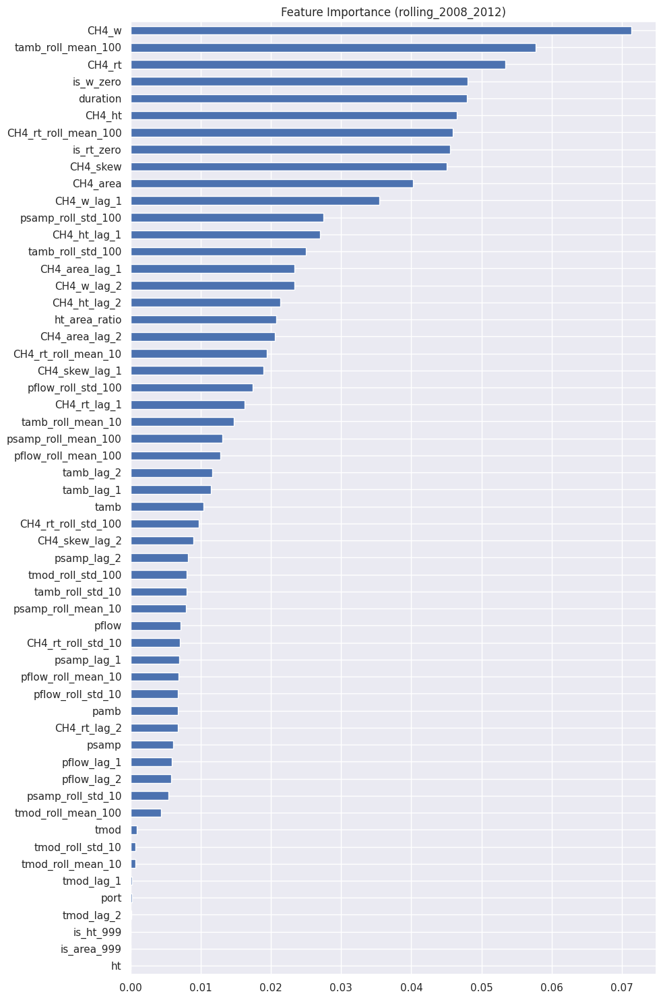

2026/06/18 18:57:26 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_project/notebooks/.venv/lib/python3.12/site-packages/mlflow/types/utils.py:440: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details."
2026/06/18 18:57:28 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_pro

Model training completed!
              precision    recall  f1-score   support

           0       1.00      0.73      0.84     10871
           1       0.34      0.99      0.50      1493

    accuracy                           0.76     12364
   macro avg       0.67      0.86      0.67     12364
weighted avg       0.92      0.76      0.80     12364



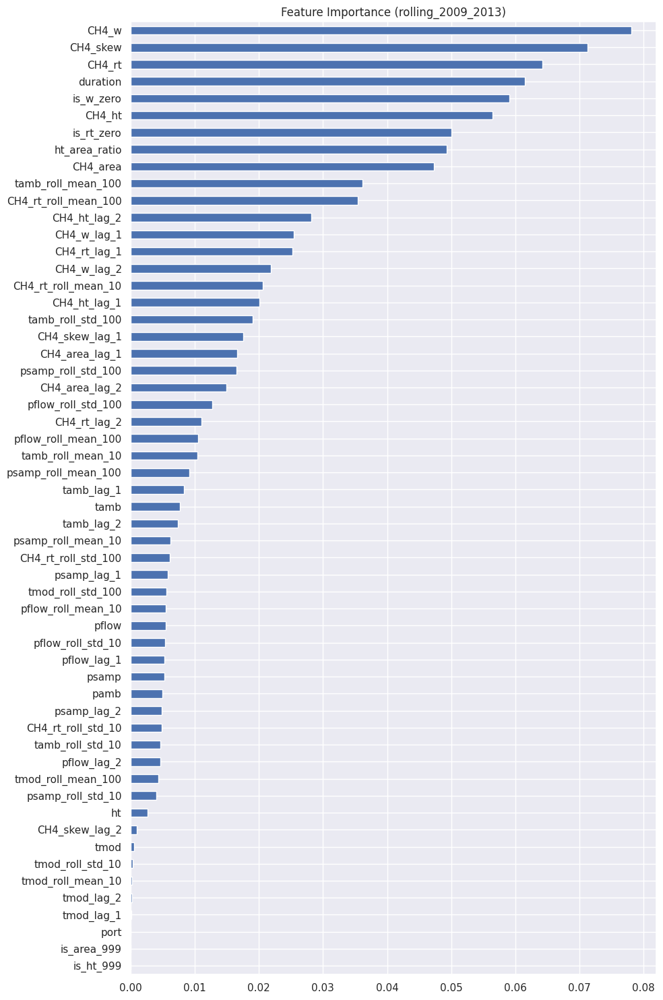

2026/06/18 18:57:47 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_project/notebooks/.venv/lib/python3.12/site-packages/mlflow/types/utils.py:440: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details."
2026/06/18 18:57:49 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_pro

Model training completed!
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     12016
           1       0.00      0.00      0.00        23

    accuracy                           1.00     12039
   macro avg       0.50      0.50      0.50     12039
weighted avg       1.00      1.00      1.00     12039



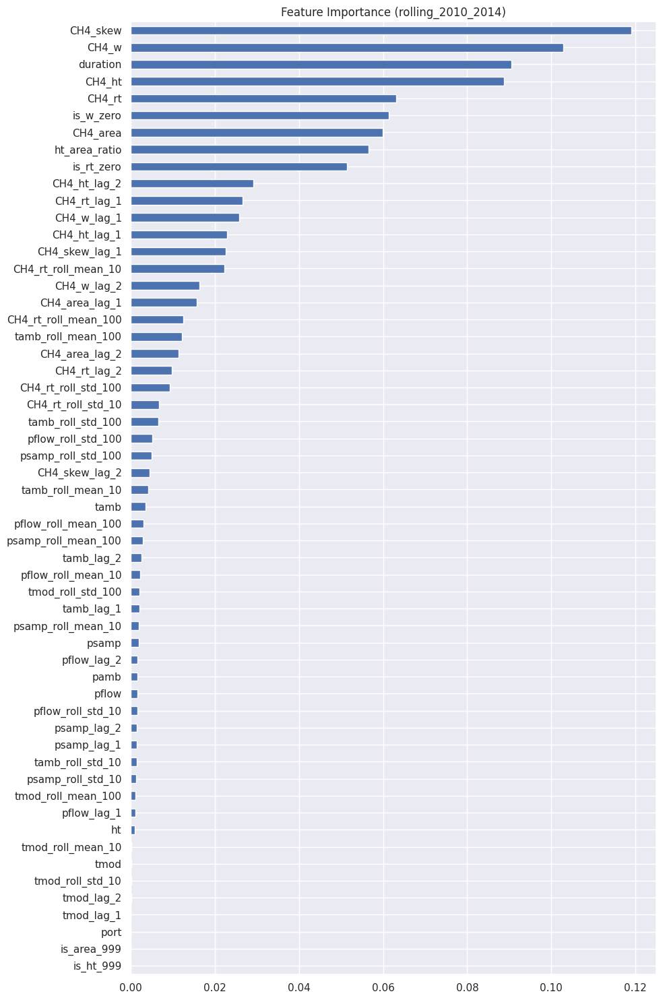

2026/06/18 18:58:07 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_project/notebooks/.venv/lib/python3.12/site-packages/mlflow/types/utils.py:440: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details."
2026/06/18 18:58:09 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_pro

Model training completed!
              precision    recall  f1-score   support

           0       0.99      1.00      0.99     12035
           1       1.00      0.32      0.48       183

    accuracy                           0.99     12218
   macro avg       0.99      0.66      0.74     12218
weighted avg       0.99      0.99      0.99     12218



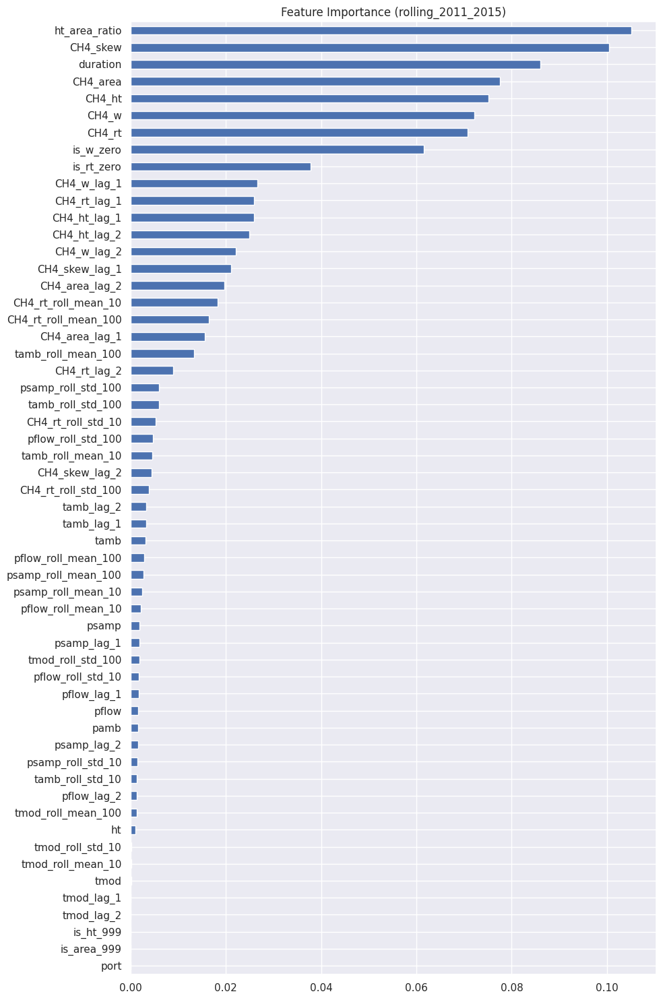

2026/06/18 18:58:27 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_project/notebooks/.venv/lib/python3.12/site-packages/mlflow/types/utils.py:440: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details."
2026/06/18 18:58:29 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_pro

Model training completed!
              precision    recall  f1-score   support

           0       0.99      0.95      0.97     12214
           1       0.02      0.10      0.04       166

    accuracy                           0.93     12380
   macro avg       0.51      0.52      0.50     12380
weighted avg       0.97      0.93      0.95     12380



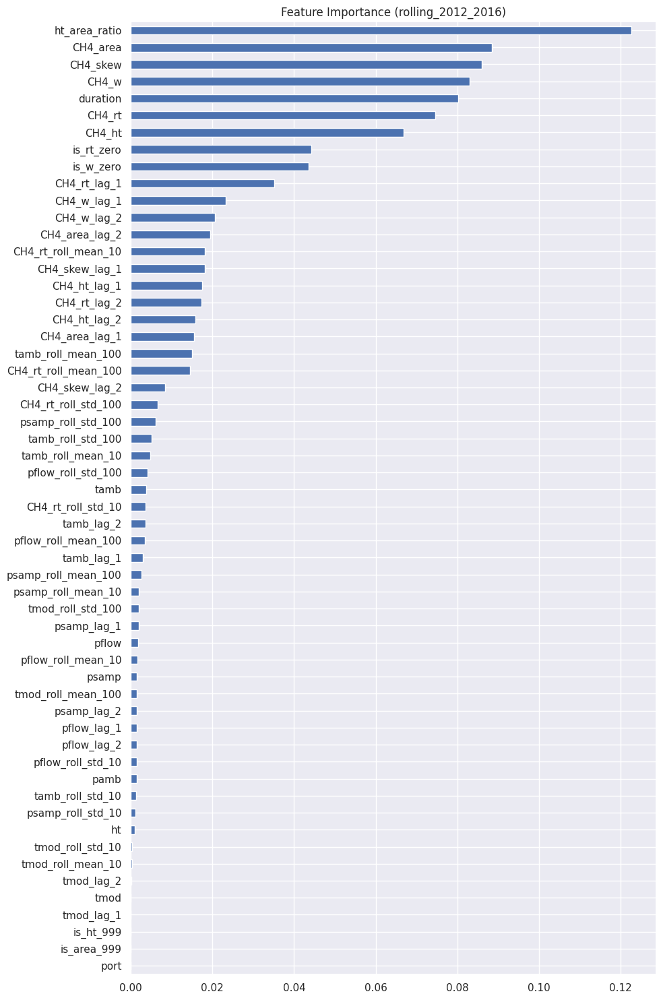

2026/06/18 18:58:47 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_project/notebooks/.venv/lib/python3.12/site-packages/mlflow/types/utils.py:440: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details."
2026/06/18 18:58:50 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_pro

Model training completed!
              precision    recall  f1-score   support

           0       0.98      0.96      0.97     11282
           1       0.16      0.23      0.19       347

    accuracy                           0.94     11629
   macro avg       0.57      0.60      0.58     11629
weighted avg       0.95      0.94      0.95     11629



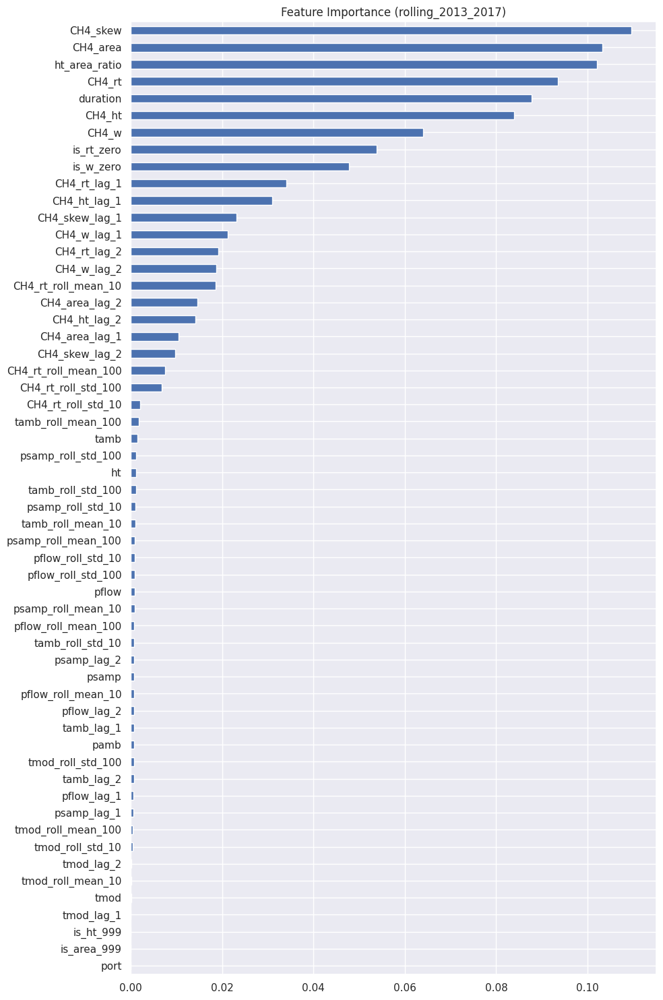

2026/06/18 18:59:08 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_project/notebooks/.venv/lib/python3.12/site-packages/mlflow/types/utils.py:440: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details."
2026/06/18 18:59:11 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_pro

Model training completed!
              precision    recall  f1-score   support

           0       0.98      1.00      0.99     11775
           1       1.00      0.45      0.62       383

    accuracy                           0.98     12158
   macro avg       0.99      0.72      0.80     12158
weighted avg       0.98      0.98      0.98     12158



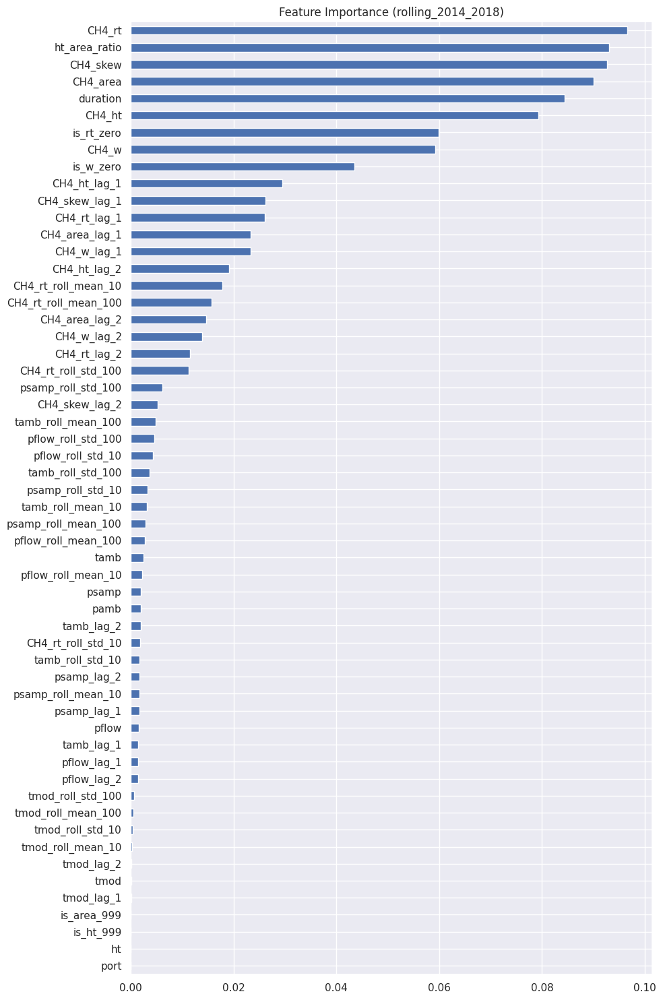

2026/06/18 18:59:29 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_project/notebooks/.venv/lib/python3.12/site-packages/mlflow/types/utils.py:440: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details."
2026/06/18 18:59:31 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_pro

Model training completed!
              precision    recall  f1-score   support

           0       0.85      0.95      0.89      7762
           1       0.88      0.69      0.77      4277

    accuracy                           0.86     12039
   macro avg       0.86      0.82      0.83     12039
weighted avg       0.86      0.86      0.85     12039



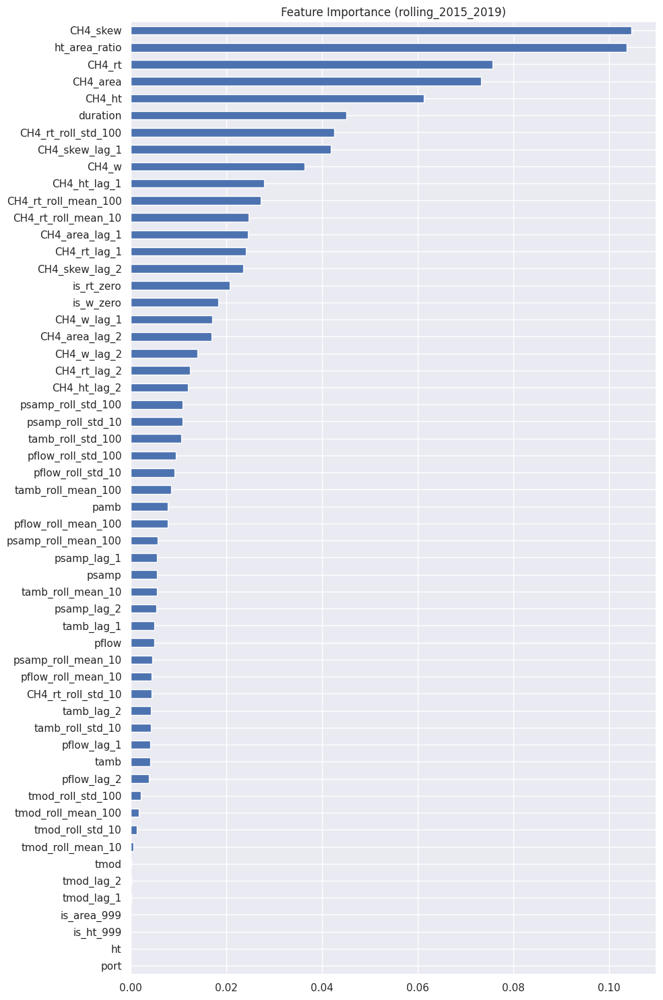

2026/06/18 18:59:50 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_project/notebooks/.venv/lib/python3.12/site-packages/mlflow/types/utils.py:440: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details."
2026/06/18 18:59:52 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_pro

Model training completed!
              precision    recall  f1-score   support

           0       0.98      0.77      0.86     11912
           1       0.04      0.44      0.08       274

    accuracy                           0.76     12186
   macro avg       0.51      0.61      0.47     12186
weighted avg       0.96      0.76      0.85     12186



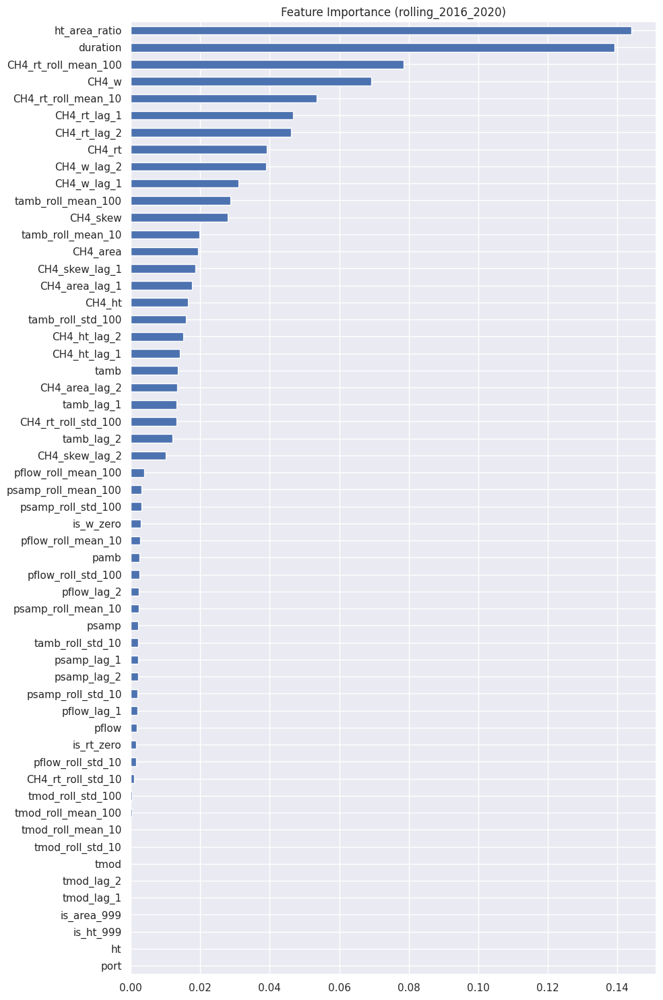

2026/06/18 19:00:11 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_project/notebooks/.venv/lib/python3.12/site-packages/mlflow/types/utils.py:440: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details."
2026/06/18 19:00:13 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_pro

Model training completed!
              precision    recall  f1-score   support

           0       0.99      0.99      0.99     10773
           1       0.60      0.72      0.66       329

    accuracy                           0.98     11102
   macro avg       0.80      0.85      0.82     11102
weighted avg       0.98      0.98      0.98     11102



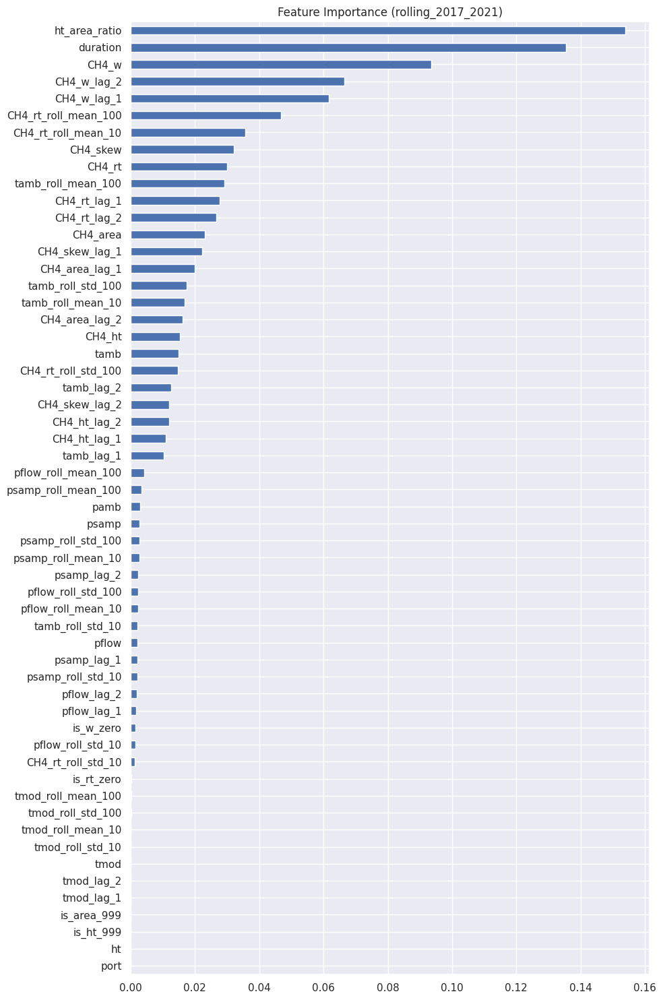

2026/06/18 19:00:30 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_project/notebooks/.venv/lib/python3.12/site-packages/mlflow/types/utils.py:440: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details."
2026/06/18 19:00:32 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_pro

Model training completed!
              precision    recall  f1-score   support

           0       0.97      0.92      0.94      9856
           1       0.67      0.84      0.75      1982

    accuracy                           0.90     11838
   macro avg       0.82      0.88      0.84     11838
weighted avg       0.92      0.90      0.91     11838



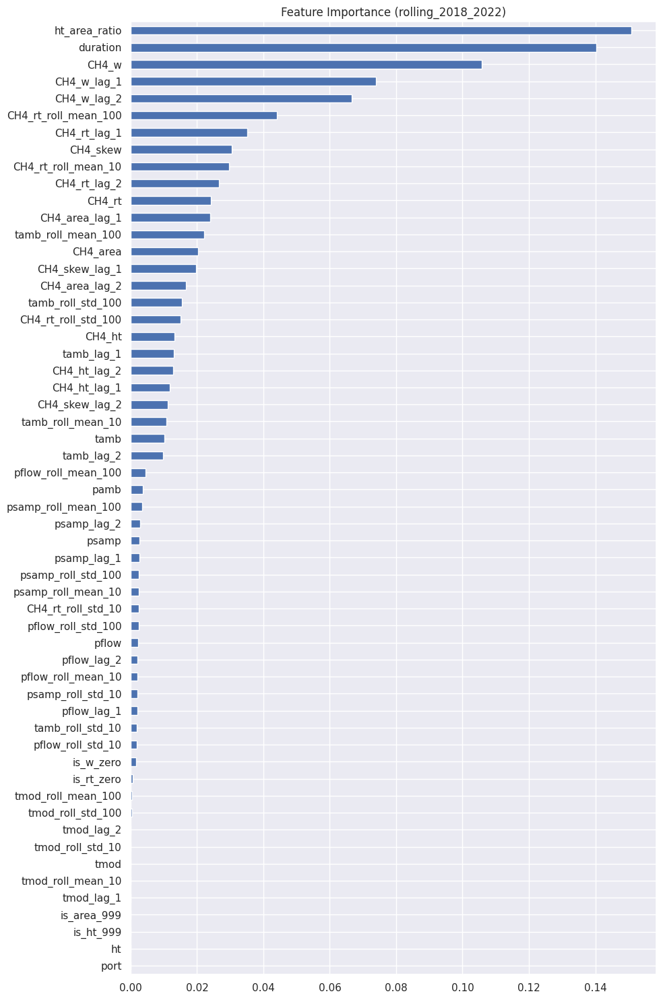

2026/06/18 19:00:50 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_project/notebooks/.venv/lib/python3.12/site-packages/mlflow/types/utils.py:440: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details."
2026/06/18 19:00:52 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_pro

Model training completed!
              precision    recall  f1-score   support

           0       0.98      1.00      0.99     11156
           1       0.99      0.39      0.56       313

    accuracy                           0.98     11469
   macro avg       0.99      0.70      0.78     11469
weighted avg       0.98      0.98      0.98     11469



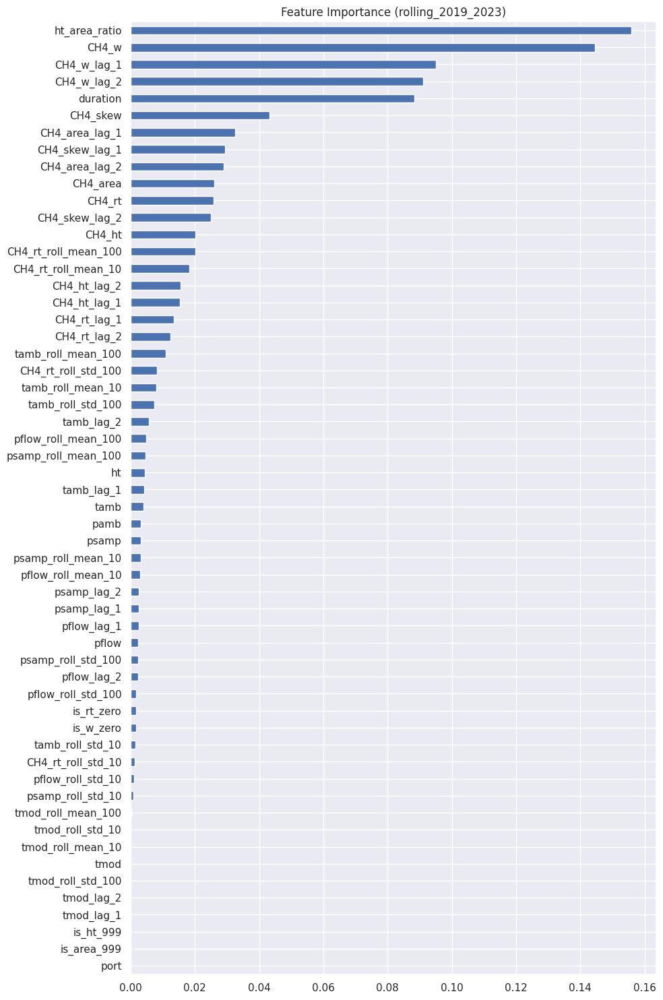

2026/06/18 19:01:10 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_project/notebooks/.venv/lib/python3.12/site-packages/mlflow/types/utils.py:440: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details."
2026/06/18 19:01:13 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_pro

Model training completed!
              precision    recall  f1-score   support

           0       0.98      0.99      0.99     11844
           1       0.08      0.04      0.05       228

    accuracy                           0.97     12072
   macro avg       0.53      0.51      0.52     12072
weighted avg       0.96      0.97      0.97     12072



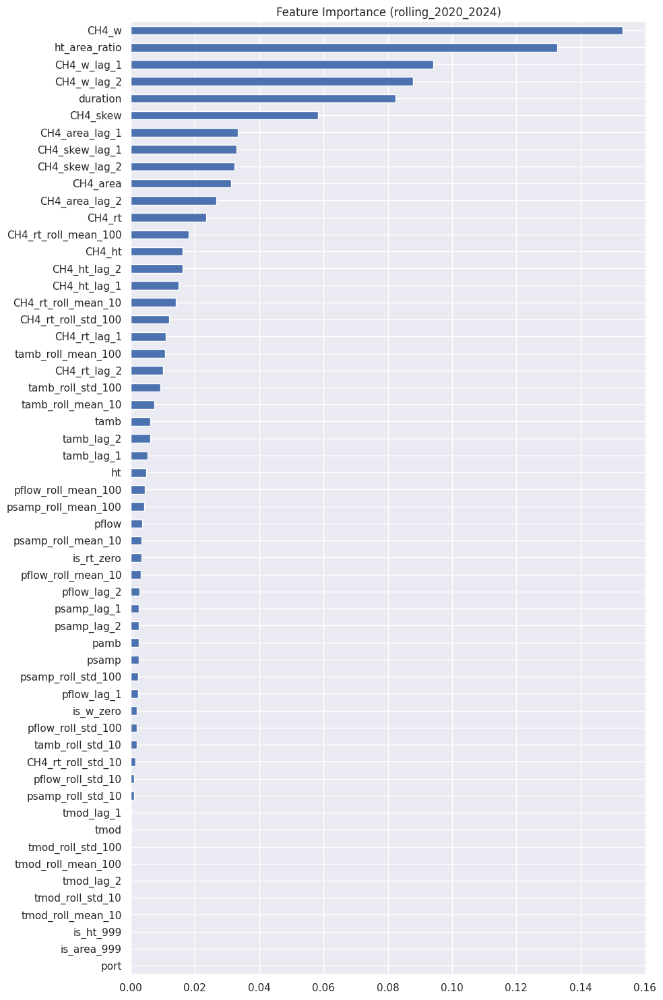

2026/06/18 19:01:30 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/ellie/research_project/notebooks/.venv/lib/python3.12/site-packages/mlflow/types/utils.py:440: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details."


2026 data not in the dataset


,training_years,testing year,threshold,F1-score,Precision,Recall,train_size,test_size
0,1994_1998,1999,0.940000,0.635036,0.465241,0.465241,55006,10728
1,1995_1999,2000,0.416546,0.608985,0.440964,0.440964,55559,10976
2,1996_2000,2001,0.119752,0.805402,0.782816,0.782816,54854,10988
3,1997_2001,2002,0.945000,0.921348,0.854167,0.854167,54178,10721
4,1998_2002,2003,0.984420,0.908602,0.832512,0.832512,53749,10920
5,1999_2003,2004,0.995000,0.866359,0.764228,0.764228,54333,10721
6,2000_2004,2005,0.975000,0.983333,0.967213,0.967213,54326,10830
7,2001_2005,2006,0.620260,0.743750,0.592040,0.592040,54180,10679
8,2002_2006,2007,0.411038,0.974359,0.950000,0.950000,53871,11315
9,2003_2007,2008,0.960000,0.851852,0.741935,0.741935,54465,11206


In [26]:
# std data rolling window =5
import pandas as pd
import mlflow
from sklearn.metrics import precision_recall_curve
from model import random_forest_model, best_threshold

years = sorted(air_data_v1['year'].unique()) # obtain year include
window = 5 # year, window length

all_results = []

for start_year in years:
    training_end_year = start_year + window- 1 # trainig set end year
    test_year = training_end_year + 1

    if test_year not in years:
        print(f"{test_year} data not in the dataset")
        break

    # extrac training and testing year data df
    training_df = air_data_v1[(air_data_v1['year']>=start_year) & (air_data_v1['year'] <= training_end_year)] 
    testing_df = air_data_v1[(air_data_v1['year'] == test_year)]
    #print(sorted(training_df['year'].unique()))
    #print(sorted(testing_df['year'].unique()))
    feature_cols = training_df[cols_all].columns.tolist()
    
    X_train = training_df[cols_all]
    y_train = training_df['label1']
    X_test = testing_df[cols_all]
    y_test = testing_df['label1']

    # training model
    mlflow.set_experiment(f'rolling_window_mhd_ml_std')
    model = random_forest_model(
        X_train, y_train, X_test, y_test,
        feature_names=feature_cols,
        experiment_run_name=f'rolling_{start_year}_{training_end_year}', n_estimators=200, max_depth=12, n_jobs=-1,
        threshold=0.5,class_weight=None
    )

    best_thres, best_f1, best_prec, best_rec = best_threshold(X_test, model, y_test)
    
    mlflow.log_param("training years", f"{start_year}-{training_end_year}")
    mlflow.log_param("test_year", test_year)
    mlflow.log_param("train_size", len(training_df))
    mlflow.log_param("test_size", len(testing_df))

    mlflow.log_metric("Best threshold", best_thres)
    mlflow.log_metric("Best F1-score",best_f1)
    mlflow.log_metric("Precision", best_prec)
    mlflow.log_metric("Recall", best_rec)

    all_results.append({
        "training_years": f"{start_year}_{training_end_year}",
        "testing year":test_year,
        "threshold":best_thres,
        "F1-score":best_f1,
        "Precision": best_rec,
        "Recall":best_rec,
        "train_size":len(training_df),
        "test_size":len(testing_df)
    })
rolling_results_air = pd.DataFrame(all_results)

rolling_results_air

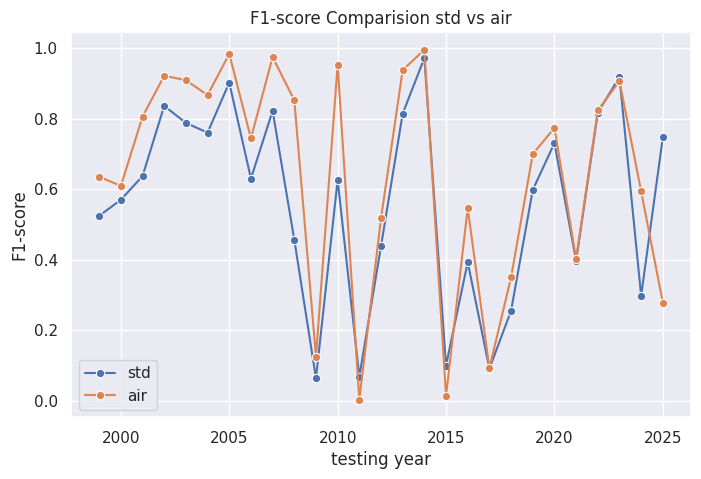

In [27]:
# F1-score
fig, ax = plt.subplots(figsize=(8,5))
sns.lineplot(data=rolling_results_std, x='testing year', y='F1-score',ax=ax, label='std', marker='o')
sns.lineplot(data=rolling_results_air, x='testing year', y='F1-score',ax=ax, label='air',marker='o')
ax.set_title("F1-score Comparision std vs air")
ax.set_ylabel('F1-score')
ax.set_xlabel('testing year')
plt.legend()
plt.show()

### Type-air data